# Modello Predittivo a 7gg

> Max Pierini, Sandra Mazzoli, Alessio Pamovio

In [1]:
import datetime as dt

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import dates as mdates
from matplotlib import ticker
from matplotlib.lines import Line2D
import scipy.stats as sps

import pickle

import arviz as az
import pyjags

from IPython.display import HTML, Latex, Markdown, clear_output

In [2]:
start = dt.datetime.now()
print(f"START: {start}")

START: 2020-09-02 10:11:06.119719


# Abstract

A simple method is presented to predict new cases and Percent Positive, estimated on effective reproduction number $R_t$ of COVID-19 in italian regions with a Markov chain Monte Carlo and Poisson likelihood parametrized on daily new cases.

# Method

New cases $y_r$ for each $r$ italian regions (source [Dipartimento Protezione Civile](https://github.com/pcm-dpc/COVID-19))will be filtered with _Hampel filter_ for outliers detection (gaussian window of 7 days, $\sigma=2$) and smoothed with rolling mean (gaussian window of 14 days, $\sigma=22$). Smoothed new cases will be adjusted to be $>0$ to avoid negative values (due to data error corrections).

For each day $t=[0,T]$ (where $T$ is the last observed day), smoothed new cases $y_{r,t}$ will be supposed distributed as **Poisson** with $\lambda_{r,t}$ parameter

$$
y_{r,t} \sim \mathcal{P}(\lambda_{r,t})
$$

where $\lambda_{r,t}$ is defined by the serial interval inverse $\gamma$, previous day smoothed new cases $k_{r,t-1}$ and effective reproduction number in time $R_{r,t}$ (ref: [Bettencourt & Ribeiro 2008](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0002185))

$$
\lambda_{r,t} = k_{r,t-1} e^{\gamma (R_{r,t} - 1)}
$$

In [3]:
SI_mu = 7.5
SI_sd = 3.4

In [4]:
display(Markdown(fr"""
The serial interval **SI** is supposed to be distributed as **Gamma**, 
with mean $\mu={SI_mu}$ and standard deviation $\sigma={SI_sd}$
(ref: [Li, Ghuan et Al. 2020a](https://www.sciencedirect.com/science/article/pii/S2468042720300063#bib6))

$$
\mathbf{{SI}} \sim \Gamma(\mu_{{={SI_mu}}}, \sigma_{{={SI_sd}}})
$$

so that $\gamma$ is distributed as **Inverse Gamma**

$$
\gamma \sim \Gamma^{{-1}}(\mu_{{={SI_mu}}}, \sigma_{{={SI_sd}}})
$$
"""))


The serial interval **SI** is supposed to be distributed as **Gamma**, 
with mean $\mu=7.5$ and standard deviation $\sigma=3.4$
(ref: [Li, Ghuan et Al. 2020a](https://www.sciencedirect.com/science/article/pii/S2468042720300063#bib6))

$$
\mathbf{SI} \sim \Gamma(\mu_{=7.5}, \sigma_{=3.4})
$$

so that $\gamma$ is distributed as **Inverse Gamma**

$$
\gamma \sim \Gamma^{-1}(\mu_{=7.5}, \sigma_{=3.4})
$$


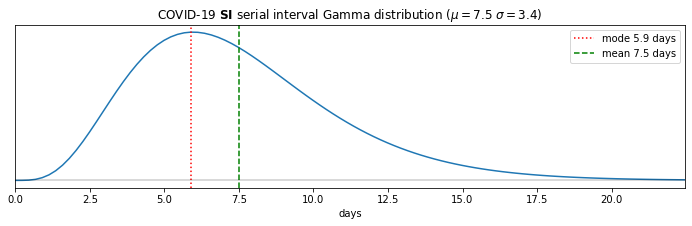

In [5]:
shape = SI_mu**2 / SI_sd**2 
scale = SI_sd**2 / SI_mu
SI_dist = sps.gamma(a=shape, scale=scale)
SI_x = np.linspace(SI_dist.ppf(0), SI_dist.ppf(.999), 100)
SI_y = SI_dist.pdf(SI_x)

omega = SI_x[SI_y.argmax()]
mean = SI_dist.stats(moments="m")

fig, ax = plt.subplots(figsize=(12, 3))
ax.plot(SI_x, SI_y)
ax.axvline(omega, c="r", ls=":", label=f"mode {omega:.1f} days")
ax.axvline(mean, c="g", ls="--", label=f"mean {mean:.1f} days")

ax.legend()
ax.axhline(0, c="k", alpha=.2)
ax.set_xlim(0, SI_x.max())
ax.set_yticks([])
ax.set_xlabel("days")
ax.set_title(fr"COVID-19 $\mathbf{{SI}}$ serial interval Gamma distribution ($\mu={SI_mu}$ $\sigma={SI_sd}$)")
plt.show();

Parameters $R_{{r,t}}$ will be distributed **Half Normal** with mean equal to previous day posteriors 
$R_{{r,t-1}}$ and overarching unknown precision $\tau$

$$
R_{{r,t}} \sim \mathcal{{N}}^+(R_{{r,t-1}}, \tau)
$$

where, first day $R_{{r,0}}$ (outcome) is set to zero

$$
R_{{r,0}} = 0
$$

and $\tau$ priors are distributed **Gamma** (partial pooling between regions) with shape and rate based on results of preliminary tests with uniformative $\tau$ distribution

$$
\tau \sim \Gamma(1000, 100)
$$

so that the standard deviation $\sigma$ will be

$$
\sigma = \frac{1}{\sqrt{\tau}}
$$

If previous new cases are zero $k_{r,t-1}=0$, parameter $R_{r,t}$ is undefined, given the chosen function for $\lambda_{r,t}$ parameter of Poisson likelihood, even if it should be $R_{r,t}=0$ (no new cases means null effective reproduction number). Thus, in these cases, priors of $R_{r,t}$ will be forced to

$$
R_{r,t} \sim \mathcal{N}^+(0, \tau)
\;,\; k_{r,t-1}=0
$$

and previous new cases will be forced to $k_{r,t-1}=1$, so that $\lambda_{r,t}$ will be

$$
\lambda_{r,t} = e^{\gamma( \mathcal{N}^+(0, \tau) - 1 )}
\;,\; k_{r,t-1}=0
$$

At the same time, $R_t$ for Italy as nation will be calculated.

Percent positive (**PP**), aka _Percent Positive Rate_ or _Positivity Rate_, can be considered as an index of disease transmission (ref: [Johns Hopkins](https://www.jhsph.edu/covid-19/articles/covid-19-testing-understanding-the-percent-positive.html)).

The index is calculated as

$$
\mathbf{PP} = \frac{ \Delta_\textrm{positive} }{ \Delta_\textrm{tested} } \cdot 100
$$

where $\Delta_\textrm{positive}$ is daily new amount of positive tests and $\Delta_\textrm{tested}$ is daily new amount of total tests.

When it's too high means that more tests are needed and/or pharmaceutical (PI) or non-pharmaceutical (NPI) interventions should be seriously considered to reduce transmission.

The "alarm threshold" has been established at 5%. World Health Organization recommend to relax COVID-19 NPI (lockdown and high level social distancing rules) if **PP** keeps below the threshold for at least two weeks.

We can add an "alert" threshold, between 3% and 5%: if **PP** raises over 3%, governments should consider a likely forthcoming alarm scenario. Below 3% can be considered in a safe area.

Percent positive index for Italy is here calculated using Dipartimento di Protezione Civile published data (ref: [GitHub](https://github.com/pcm-dpc/COVID-19)) filterd with _Hampel filter_ for outliers (gaussian window of 14 days, $\sigma=5$) and smoothed with rolling mean (gaussian window of 7 days, $\sigma=2$).

To predict $y_{\mathrm{pred},{T+p}}$ new cases in Italy and regions for the next $p=[1 ... P]$ days, the same likelihood will be used, distributing new cases as **Poisson** with $\lambda_{\mathrm{pred},{T+p}}$ parameter

$$
y_{\mathrm{pred},{T+p}} \sim \mathcal{P}(\lambda_{\mathrm{pred},{T+p}}) \;,\; p=[1 ... P]
$$

where $\lambda_{\mathrm{pred},{T+p}}$ is parametrized on $\gamma$, the posteriors of estimated $y_{\mathrm{pred},{T+p-1}}$ and the $R_{T+p}^*$, where $R_{T}^*$ is the mean of estimated effective reproduction number in the last observed $d$ days

$$
R_t^* = \frac{ \sum_{T-d}^{T}{R_i} }{ d }
$$

$$
\lambda_{\mathrm{pred},t} = y_{\mathrm{pred},{T+p-1}} \cdot e^{\gamma (R_{T+p}^* - 1)}
$$

where $y_{\mathrm{pred},{T+p-1}}$ are distributed **Half Normal** with uknown precision

$$
y_{\mathrm{pred},{T+p-1}} \sim \mathcal{N}^+ \left( \mu=y_{\mathrm{pred},{T+p-1}} , \tau_{\mathrm{pred}} \right)
$$

and

$$
\tau_{\mathrm{pred}} \sim \Gamma( 1, 1)
$$

To predict best and worst scenario, $R_p^*$ will be supposed to be respectively higher and lower by $\varepsilon$

$$
R^*_{T+p,\mathrm{best}} = R_{T+p}^* - \frac{p}{P} \varepsilon \;,\; p=[1...P]
$$

$$
R^*_{T+p,\mathrm{worst}} = R_{T+p}^* + \frac{p}{P} \varepsilon \;,\; p=[1...P]
$$

where $\varepsilon$ is the mean of previously estimated $R_t$ variation within $P$ days, rounded to 2 decimals (see [Epsilon](#Epsilon)).

Predicted $\mathbf{PP}_{T+p}$ will be calculated as

$$
\mathbf{PP}_{T+p} = \frac{ y_{\mathrm{pred},T+p} }{ \Delta_{\mathrm{tested}}^* } \cdot 100
$$

where $y_{\mathrm{pred},{T+p}}$ are estimated posteriors of predicted new cases and $\Delta_{\mathrm{tested}}^*$ is the last value of filtered and smoothed tested daily cases.

In [6]:
adapt = 500
warmup = 2000
sample = 2000

In [7]:
display(Markdown(f"""
A Markov chain Monte Carlo will be used with Metropolis-Hasting algorithm and Gibbs sampler 
(adapt {adapt}, warmup {warmup}, samples {sample}, chains 4, thin 1) in `Python 3.8.5` with `pyjags==1.3.7`
and `JAGS 4.3.0` for macOS.
"""))


A Markov chain Monte Carlo will be used with Metropolis-Hasting algorithm and Gibbs sampler 
(adapt 500, warmup 2000, samples 2000, chains 4, thin 1) in `Python 3.8.5` with `pyjags==1.3.7`
and `JAGS 4.3.0` for macOS.


In [8]:
# find and fix outliers using Hampel filter
# Impl from: https://towardsdatascience.com/outlier-detection-with-hampel-filter-85ddf523c73d

def hampel_filter_pandas(input_series, window_size, n_sigmas=3.0):

    k = 1.4826 # scale factor for Gaussian distribution
    new_series = input_series.copy()

    # helper lambda function 
    MAD = lambda x: np.median(np.abs(x - np.median(x)))
    
    # the use of min_periods is to have rolling window extend towards
    # the end of the data series; in effect, we can apply hampel filter
    # to most recent observations
    # taken from: https://stackoverflow.com/questions/48953313/pandas-rolling-window-boundary-on-start-end-of-series/48953314#48953314
    rolling_window_size = 2*window_size+1
    rolling_median = input_series.rolling(
        window=rolling_window_size,
        min_periods=(rolling_window_size//2),
        center=True).median()
    rolling_mad = k * input_series.rolling(
        window=rolling_window_size,
        min_periods=(rolling_window_size//2),
        center=True).apply(MAD)
    # print(f'rolling_mad = {rolling_mad}, rolling_median = {rolling_median}')
    diff = np.abs(input_series - rolling_median)
    
    where = diff > (n_sigmas * rolling_mad)
    indices = np.argwhere(where.to_numpy()).flatten()
    new_series[indices] = rolling_median[indices]
    
    return new_series, indices

In [9]:
it = pd.read_csv(
    "https://raw.githubusercontent.com/pcm-dpc/COVID-19/master/dati-andamento-nazionale/dpc-covid19-ita-andamento-nazionale.csv",
     usecols=['data', 'nuovi_positivi', 'casi_testati'],
     parse_dates=['data'],
     index_col=['data'],
     squeeze=True).sort_index()

df = pd.read_csv(
    "https://raw.githubusercontent.com/pcm-dpc/COVID-19/master/dati-regioni/dpc-covid19-ita-regioni.csv",
     usecols=['data', 'denominazione_regione', 'nuovi_positivi', 'casi_testati'],
     parse_dates=['data'],
     index_col=['denominazione_regione', 'data'],
     squeeze=True).sort_index()

countries = df.index.get_level_values("denominazione_regione").unique().sort_values()

days = it.index.get_level_values("data").unique()

In [10]:
pos_it_raw = it['nuovi_positivi']
pos_it_flt, _ = hampel_filter_pandas(pos_it_raw, 7, n_sigmas=2.0)

pos_it_smt = pos_it_flt.rolling(14,
                win_type='gaussian',
                min_periods=1,
                center=True).mean(std=5).round()
pos_it_smt[pos_it_smt<0] = 0

tst_it_raw = it['casi_testati'].diff()
tst_it_flt, _ = hampel_filter_pandas(tst_it_raw, 7, n_sigmas=2.0)

tst_it_smt = tst_it_flt.rolling(14,
                win_type='gaussian',
                min_periods=1,
                center=True).mean(std=5).round()
tst_it_smt[tst_it_smt<0] = 0

####################

pos_Y_raw = np.ndarray(shape=(countries.size, days.size))
pos_Y_flt = np.ndarray(shape=(countries.size, days.size))
pos_Y_smt = np.ndarray(shape=(countries.size, days.size))

tst_Y_raw = np.ndarray(shape=(countries.size, days.size))
tst_Y_flt = np.ndarray(shape=(countries.size, days.size))
tst_Y_smt = np.ndarray(shape=(countries.size, days.size))

for r, region in enumerate(countries):

    pos_y_raw = df.loc[region]['nuovi_positivi']
    pos_y_flt, _ = hampel_filter_pandas(pos_y_raw, 7, n_sigmas=2.0)
    pos_y_smt = pos_y_flt.rolling(14,
                win_type='gaussian',
                min_periods=1,
                center=True).mean(std=5).round()
    pos_y_smt[pos_y_smt<0] = 0
    
    tst_y_raw = df.loc[region]['casi_testati'].diff()
    tst_y_flt, _ = hampel_filter_pandas(tst_y_raw, 7, n_sigmas=2.0)
    tst_y_smt = tst_y_flt.rolling(14,
                win_type='gaussian',
                min_periods=1,
                center=True).mean(std=5).round()
    tst_y_smt[tst_y_smt<0] = 0
    
    pos_Y_raw[r] = pos_y_raw.values
    pos_Y_flt[r] = pos_y_flt.values
    pos_Y_smt[r] = pos_y_smt.values
    
    tst_Y_raw[r] = tst_y_raw.values
    tst_Y_flt[r] = tst_y_flt.values
    tst_Y_smt[r] = tst_y_smt.values

## Epsilon

Given previously estimated $R_t$ mean with this model and $\Delta_d (R_t)$ the absolute variation of $R_t$ within $d$ days, $\varepsilon$ can be supposed as the mean of $\Delta_d (R_t)$, rounded to 2 decimals.

$$
\varepsilon = \left\lceil \overline{\Delta_d (R_t)} \right\rfloor
$$

In [11]:
with open('posterior_samples_italy_R.pkl_ok', 'rb') as f:
    previous_post = pickle.load(f)

prev_az = az.from_pyjags({"R": previous_post}, warmup_iterations=warmup, save_warmup=False)
prev_smry = az.summary(prev_az, var_names="R", kind="stats")

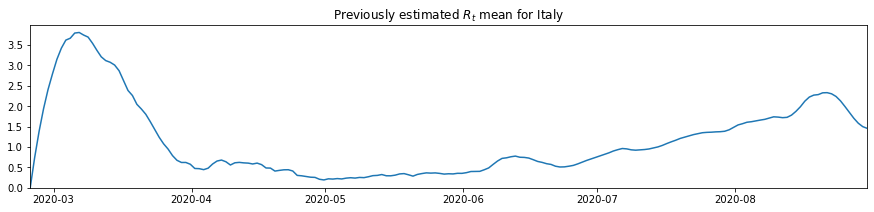

In [12]:
fig, ax = plt.subplots(figsize=(15,3))
ax.plot(days[0:prev_smry.index.size], prev_smry['mean'])
ax.set_xlim(days[0], days[prev_smry.index.size-1])
ax.set_ylim(0, prev_smry['mean'].max()*1.05)
ax.set_title("Previously estimated $R_t$ mean for Italy")
plt.show();

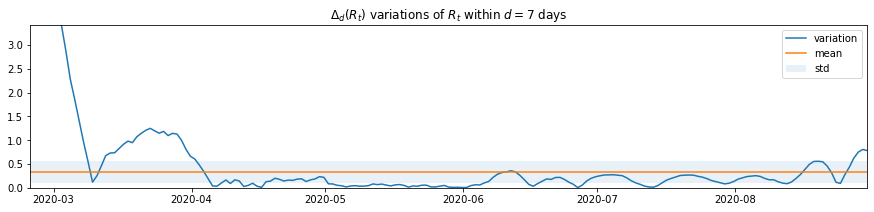

In [13]:
Rdiffs = np.abs(prev_smry['mean'].diff(periods=7).values)
Rvar = Rdiffs[Rdiffs>0].mean()
Rstd = Rdiffs[Rdiffs>0].std()

fig, ax = plt.subplots(figsize=(15, 3))
ax.plot(days[0:prev_smry.index.size], Rdiffs, label="variation")
ax.fill_between(
    days[0:prev_smry.index.size],
    Rvar - Rstd/2, Rvar + Rstd/2,
    alpha=.1, label="std"
)
ax.axhline(Rvar, c="C1", label="mean")

ax.set_xlim(days[0], days[prev_smry.index.size-1])
ax.set_ylim(0, Rdiffs[Rdiffs>0].max())
ax.legend()
ax.set_title(r"$\Delta_d (R_t)$ variations of $R_t$ within $d=7$ days")
plt.show();

In [14]:
epsilon = np.round(Rvar, decimals=2)
#epsilon = 0.35

display(Markdown(fr"""
The mean of $\Delta_7 (R_t)$ is equal to ${Rvar:.5f} \pm {Rstd/2:.5f}$.

$$
\varepsilon = \left \lceil {Rvar:.5f} \right \rfloor =
{epsilon}
$$
"""))


The mean of $\Delta_7 (R_t)$ is equal to $0.33245 \pm 0.23636$.

$$
\varepsilon = \left \lceil 0.33245 \right \rfloor =
0.33
$$


## Model

In [15]:
modelStringItaly = f"""
model {{
    ###################################
    # Rt estimation
    ###################################
    # Overarching Rt standard deviation
    tau_R ~ dgamma( 1000 , 100 )
    sigma_R <- 1 / sqrt( tau_R )

    # Serial interval distribution
    SI_mu <- {SI_mu}
    SI_sd <- {SI_sd}
    SI_sh <- SI_mu^2 / SI_sd^2
    SI_ra <- SI_mu / SI_sd^2
    SI ~ dgamma( SI_sh , SI_ra )
    gamma <- 1 / SI
    
    for ( r in 1:C ) {{
        # First Rt prior
        RR[r,1] <- 0
        for ( t in 2:T ) {{
            # Rt prior for k>0
            RRpr[r,t] ~ dnorm( RR[r,(t-1)] , tau_R )  T(0,)
            # Rt prior for k=0
            RRnu[r,t] ~ dnorm( 0 , tau_R )  T(0,)

            # Define Rt prior
            RR[r,t] <- ifelse( kR[r,t-1]==0 , RRnu[r,t] , RRpr[r,t] )
            # Avoid k=0 (undefined Rt)
            KR[r,t] <- ifelse( kR[r,t-1]==0, 1 , kR[r,t-1] )

            # Poisson likelihood
            lambdaR[r,t] <- KR[r,t] * exp( gamma * ( RR[r,t] - 1 ) )
            yR[r,t] ~ dpois( lambdaR[r,t] )
        }}
    }}
    
    # First Rt prior
    R[1] <- 0
    for ( t in 2:T ) {{
        # Rt prior for k>0
        Rpr[t] ~ dnorm( R[t-1] , tau_R )  T(0,)
        # Rt prior for k=0
        Rnu[t] ~ dnorm( 0 , tau_R )  T(0,)

        # Define Rt prior
        R[t] <- ifelse( k[t-1]==0 , Rnu[t] , Rpr[t] )
        # Avoid k=0 (undefined Rt)
        K[t] <- ifelse( k[t-1]==0, 1 , k[t-1] )

        # Poisson likelihood
        lambda[t] <- K[t] * exp( gamma * ( R[t] - 1 ) )
        y[t] ~ dpois( lambda[t] )
    }}
    
    ###################################
    # Predictions
    ###################################
    R_pred <- sum(R[(T-P):T]) / P
    y_pred[1] <- y[T]
    y_pred_hi[1] <- y[T]
    y_pred_lo[1] <- y[T]
    PP[1] <- PPobs
    PP_lo[1] <- PPobs
    PP_hi[1] <- PPobs
    
    # New cases precision prior
    y_tau ~ dgamma( 1 , 1 )
    
    for ( r in 1:C ) {{
        RR_pred[r] <- sum(RR[r,((T-P):T)]) / P
        yR_pred[r,1] <- yR[r,T]
        yR_pred_hi[r,1] <- yR[r,T]
        yR_pred_lo[r,1] <- yR[r,T]
        PPR[r,1] <- PPRobs[r]
        PPR_lo[r,1] <- PPRobs[r]
        PPR_hi[r,1] <- PPRobs[r]
        
        for ( p in 2:P ) {{
            RR_pred_hi[r,p] <- RR_pred[r] + {epsilon} * (p-1) / (P-1)
            RR_pred_lo[r,p] <- RR_pred[r] - {epsilon} * (p-1) / (P-1)
        
            # most likely scenario
            yR_prior[r,p] ~ dnorm( yR_pred[r,p-1] , y_tau )  T(0,)
            lambdaR_pred[r,p] <- yR_prior[r,p] * exp( gamma * ( RR_pred[r] - 1 ) )
            yR_pred[r,p] ~ dpois( lambdaR_pred[r,p] )
            PPR[r,p] <- yR_pred[r,p] / testsR[r] * 100

            # worst scenario
            yR_prior_hi[r,p] ~ dnorm( yR_pred_hi[r,p-1] , y_tau )  T(0,)
            lambdaR_pred_hi[r,p] <- yR_prior_hi[r,p] * exp( gamma * ( RR_pred_hi[r,p] - 1 ) )
            yR_pred_hi[r,p] ~ dpois( lambdaR_pred_hi[r,p] )
            PPR_hi[r,p] <- yR_pred_hi[r,p] / testsR[r] * 100

            # best scenario
            yR_prior_lo[r,p] ~ dnorm( yR_pred_lo[r,p-1] , y_tau )  T(0,)
            lambdaR_pred_lo[r,p] <- yR_prior_lo[r,p] * exp( gamma * ( RR_pred_lo[r,p] - 1 ) )
            yR_pred_lo[r,p] ~ dpois( lambdaR_pred_lo[r,p] )
            PPR_lo[r,p] <- yR_pred_lo[r,p] / testsR[r] * 100
        }}
    }}
    
    for ( p in 2:P ) {{
        R_pred_hi[p] <- R_pred + {epsilon} * (p-1) / (P-1)
        R_pred_lo[p] <- R_pred - {epsilon} * (p-1) / (P-1)
    
        # most likely scenario
        y_prior[p] ~ dnorm( y_pred[p-1] , y_tau )  T(0,)
        lambda_pred[p] <- y_prior[p] * exp( gamma * ( R_pred - 1 ) )
        y_pred[p] ~ dpois( lambda_pred[p] )
        PP[p] <- y_pred[p] / tests * 100
        
        # worst scenario
        y_prior_hi[p] ~ dnorm( y_pred_hi[p-1] , y_tau )  T(0,)
        lambda_pred_hi[p] <- y_prior_hi[p] * exp( gamma * ( R_pred_hi[p] - 1 ) )
        y_pred_hi[p] ~ dpois( lambda_pred_hi[p] )
        PP_hi[p] <- y_pred_hi[p] / tests * 100
        
        # best scenario
        y_prior_lo[p] ~ dnorm( y_pred_lo[p-1] , y_tau )  T(0,)
        lambda_pred_lo[p] <- y_prior_lo[p] * exp( gamma * ( R_pred_lo[p] - 1 ) )
        y_pred_lo[p] ~ dpois( lambda_pred_lo[p] )
        PP_lo[p] <- y_pred_lo[p] / tests * 100
    }}
}}
"""

In [16]:
display(Markdown(f"```R\n{modelStringItaly}\n```"))

```R

model {
    ###################################
    # Rt estimation
    ###################################
    # Overarching Rt standard deviation
    tau_R ~ dgamma( 1000 , 100 )
    sigma_R <- 1 / sqrt( tau_R )

    # Serial interval distribution
    SI_mu <- 7.5
    SI_sd <- 3.4
    SI_sh <- SI_mu^2 / SI_sd^2
    SI_ra <- SI_mu / SI_sd^2
    SI ~ dgamma( SI_sh , SI_ra )
    gamma <- 1 / SI
    
    for ( r in 1:C ) {
        # First Rt prior
        RR[r,1] <- 0
        for ( t in 2:T ) {
            # Rt prior for k>0
            RRpr[r,t] ~ dnorm( RR[r,(t-1)] , tau_R )  T(0,)
            # Rt prior for k=0
            RRnu[r,t] ~ dnorm( 0 , tau_R )  T(0,)

            # Define Rt prior
            RR[r,t] <- ifelse( kR[r,t-1]==0 , RRnu[r,t] , RRpr[r,t] )
            # Avoid k=0 (undefined Rt)
            KR[r,t] <- ifelse( kR[r,t-1]==0, 1 , kR[r,t-1] )

            # Poisson likelihood
            lambdaR[r,t] <- KR[r,t] * exp( gamma * ( RR[r,t] - 1 ) )
            yR[r,t] ~ dpois( lambdaR[r,t] )
        }
    }
    
    # First Rt prior
    R[1] <- 0
    for ( t in 2:T ) {
        # Rt prior for k>0
        Rpr[t] ~ dnorm( R[t-1] , tau_R )  T(0,)
        # Rt prior for k=0
        Rnu[t] ~ dnorm( 0 , tau_R )  T(0,)

        # Define Rt prior
        R[t] <- ifelse( k[t-1]==0 , Rnu[t] , Rpr[t] )
        # Avoid k=0 (undefined Rt)
        K[t] <- ifelse( k[t-1]==0, 1 , k[t-1] )

        # Poisson likelihood
        lambda[t] <- K[t] * exp( gamma * ( R[t] - 1 ) )
        y[t] ~ dpois( lambda[t] )
    }
    
    ###################################
    # Predictions
    ###################################
    R_pred <- sum(R[(T-P):T]) / P
    y_pred[1] <- y[T]
    y_pred_hi[1] <- y[T]
    y_pred_lo[1] <- y[T]
    PP[1] <- PPobs
    PP_lo[1] <- PPobs
    PP_hi[1] <- PPobs
    
    # New cases precision prior
    y_tau ~ dgamma( 1 , 1 )
    
    for ( r in 1:C ) {
        RR_pred[r] <- sum(RR[r,((T-P):T)]) / P
        yR_pred[r,1] <- yR[r,T]
        yR_pred_hi[r,1] <- yR[r,T]
        yR_pred_lo[r,1] <- yR[r,T]
        PPR[r,1] <- PPRobs[r]
        PPR_lo[r,1] <- PPRobs[r]
        PPR_hi[r,1] <- PPRobs[r]
        
        for ( p in 2:P ) {
            RR_pred_hi[r,p] <- RR_pred[r] + 0.33 * (p-1) / (P-1)
            RR_pred_lo[r,p] <- RR_pred[r] - 0.33 * (p-1) / (P-1)
        
            # most likely scenario
            yR_prior[r,p] ~ dnorm( yR_pred[r,p-1] , y_tau )  T(0,)
            lambdaR_pred[r,p] <- yR_prior[r,p] * exp( gamma * ( RR_pred[r] - 1 ) )
            yR_pred[r,p] ~ dpois( lambdaR_pred[r,p] )
            PPR[r,p] <- yR_pred[r,p] / testsR[r] * 100

            # worst scenario
            yR_prior_hi[r,p] ~ dnorm( yR_pred_hi[r,p-1] , y_tau )  T(0,)
            lambdaR_pred_hi[r,p] <- yR_prior_hi[r,p] * exp( gamma * ( RR_pred_hi[r,p] - 1 ) )
            yR_pred_hi[r,p] ~ dpois( lambdaR_pred_hi[r,p] )
            PPR_hi[r,p] <- yR_pred_hi[r,p] / testsR[r] * 100

            # best scenario
            yR_prior_lo[r,p] ~ dnorm( yR_pred_lo[r,p-1] , y_tau )  T(0,)
            lambdaR_pred_lo[r,p] <- yR_prior_lo[r,p] * exp( gamma * ( RR_pred_lo[r,p] - 1 ) )
            yR_pred_lo[r,p] ~ dpois( lambdaR_pred_lo[r,p] )
            PPR_lo[r,p] <- yR_pred_lo[r,p] / testsR[r] * 100
        }
    }
    
    for ( p in 2:P ) {
        R_pred_hi[p] <- R_pred + 0.33 * (p-1) / (P-1)
        R_pred_lo[p] <- R_pred - 0.33 * (p-1) / (P-1)
    
        # most likely scenario
        y_prior[p] ~ dnorm( y_pred[p-1] , y_tau )  T(0,)
        lambda_pred[p] <- y_prior[p] * exp( gamma * ( R_pred - 1 ) )
        y_pred[p] ~ dpois( lambda_pred[p] )
        PP[p] <- y_pred[p] / tests * 100
        
        # worst scenario
        y_prior_hi[p] ~ dnorm( y_pred_hi[p-1] , y_tau )  T(0,)
        lambda_pred_hi[p] <- y_prior_hi[p] * exp( gamma * ( R_pred_hi[p] - 1 ) )
        y_pred_hi[p] ~ dpois( lambda_pred_hi[p] )
        PP_hi[p] <- y_pred_hi[p] / tests * 100
        
        # best scenario
        y_prior_lo[p] ~ dnorm( y_pred_lo[p-1] , y_tau )  T(0,)
        lambda_pred_lo[p] <- y_prior_lo[p] * exp( gamma * ( R_pred_lo[p] - 1 ) )
        y_pred_lo[p] ~ dpois( lambda_pred_lo[p] )
        PP_lo[p] <- y_pred_lo[p] / tests * 100
    }
}

```

# Results

In [17]:
old_settings = np.seterr(all='ignore')

PP_raw = it['nuovi_positivi'][1:] / it['casi_testati'].diff()[1:] * 100
PP_flt = pos_it_flt.values[1:] / tst_it_flt.values[1:] * 100
PP_smt = pos_it_smt.values[1:] / tst_it_smt.values[1:] * 100

PPR_raw = pos_Y_raw[:,1:] / tst_Y_raw[:,1:] * 100
PPR_flt = pos_Y_flt[:,1:] / tst_Y_flt[:,1:] * 100
PPR_smt = pos_Y_smt[:,1:] / tst_Y_smt[:,1:] * 100

np.seterr(**old_settings);

In [18]:
prediction = 7

model_data_italy = {
    # national
    "y": pos_it_smt.values,
    "k": pos_it_smt.values,
    "tests": tst_it_smt.values[-1],
    "PPobs": PP_smt[-1],
    # regional
    "yR": pos_Y_smt,
    "kR": pos_Y_smt,
    "testsR": tst_Y_smt[:,-1],
    "PPRobs": PPR_smt[:,-1],
    # global
    "C": countries.size,
    "T": days.size,
    "P": prediction+1,
}

In [19]:
jags_posteriors_italy = None

print("Starting MCMC...")

jags_model_italy = pyjags.Model(
    code=modelStringItaly, 
    data=model_data_italy,
    chains=4, 
    adapt=adapt,
    progress_bar=True
)

jags_posteriors_italy = jags_model_italy.sample(
    warmup + sample, vars=[
        "sigma_R",
        "R", "y_pred", "y_pred_hi", "y_pred_lo", "PP", "PP_hi", "PP_lo",
        "RR", "yR_pred", "yR_pred_hi", "yR_pred_lo", "PPR", "PPR_hi", "PPR_lo"
    ]
)

clear_output()

In [20]:
with open("posterior_samples_italy_R.pkl", "wb") as f:
    pickle.dump(jags_posteriors_italy["R"], f)

with open("posterior_samples_regions_R.pkl", "wb") as f:
    pickle.dump(jags_posteriors_italy["RR"], f)

## Italy

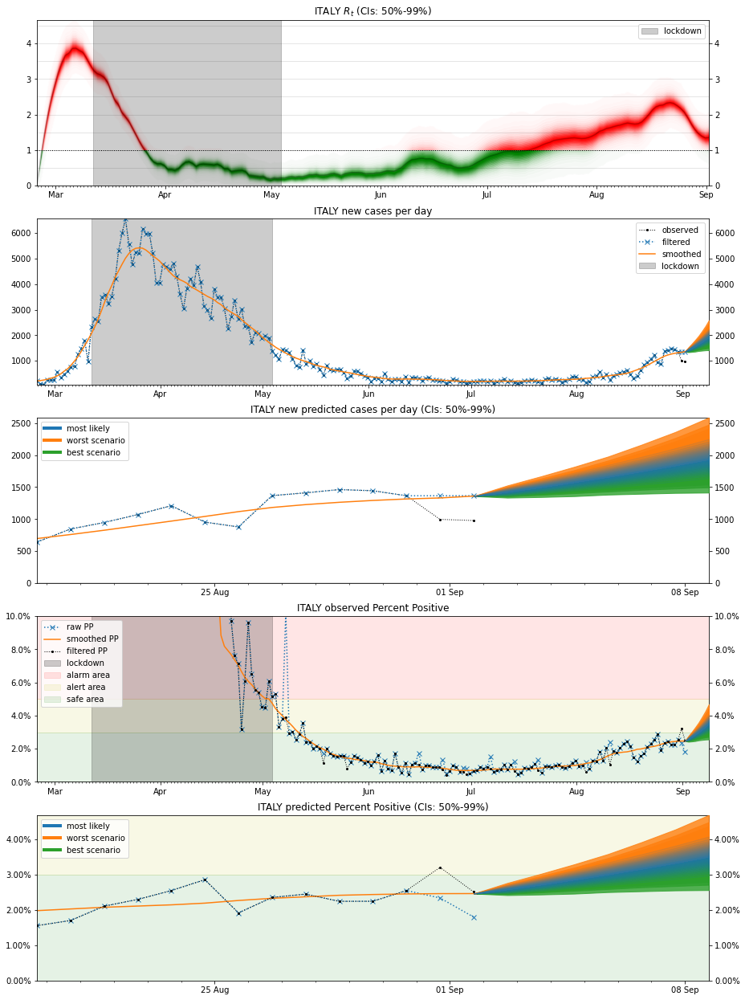

In [22]:
percs = np.linspace(50, 99, 20)

ymax = np.array([])
uppers = np.ndarray(shape=(len(percs), days.size))
lowers = np.ndarray(shape=(len(percs), days.size))

pyjags_data_italy = az.from_pyjags({
    "R": jags_posteriors_italy["R"],
    "y_pred": jags_posteriors_italy["y_pred"],
    "PP": jags_posteriors_italy["PP"],
    "y_pred_hi": jags_posteriors_italy["y_pred_hi"],
    "y_pred_lo": jags_posteriors_italy["y_pred_lo"],
    "PP_lo": jags_posteriors_italy["PP_lo"],
    "PP_hi": jags_posteriors_italy["PP_hi"],
}, warmup_iterations=warmup, save_warmup=False)
summary = az.summary(pyjags_data_italy, var_names="R", kind="stats")
for i, p in enumerate(percs[::-1]):
    upper = np.percentile(pyjags_data_italy.posterior.R, p, axis=1)
    upper = np.mean(upper, axis=0)
    lower = np.percentile(pyjags_data_italy.posterior.R, 100-p, axis=1)
    lower = np.mean(lower, axis=0)
    ymax = np.append(ymax, upper.max())
    uppers[i] = upper
    lowers[i] = lower
pred_means_it = az.summary(pyjags_data_italy, var_names="y_pred", kind="stats")['mean']
PP_pred_means_it = az.summary(pyjags_data_italy, var_names="PP", kind="stats")['mean']
ymax = ymax.max()

        
fig, ax = plt.subplots(5, 1, figsize=(15, 22))

pred_days = pd.date_range(days[-1], days[-1]+pd.Timedelta(days=7), freq="1d")

y_predmax = np.array([])
PP_max = np.array([])
for c, pred in enumerate(['', '_hi', '_lo']):
    y_pred = f"y_pred{pred}"
    PP = f"PP{pred}"
    for i, p in enumerate(percs[::-1]):
        if not pred:
            p -= 4
        y_upper = np.percentile(pyjags_data_italy.posterior[y_pred], p, axis=1)
        y_upper = np.mean(y_upper, axis=0)
        PP_upper = np.percentile(pyjags_data_italy.posterior[PP], p, axis=1)
        PP_upper = np.mean(PP_upper, axis=0)
        
        y_lower = np.percentile(pyjags_data_italy.posterior[y_pred], 100-p, axis=1)
        y_lower = np.mean(y_lower, axis=0)
        PP_lower = np.percentile(pyjags_data_italy.posterior[PP], 100-p, axis=1)
        PP_lower = np.mean(PP_lower, axis=0)
        
        y_predmax = np.append(y_predmax, y_upper.max())
        PP_max = np.append(PP_max, PP_upper.max())
        
        alpha=.8
        if not pred:
            alpha = .1
        if pred == '_lo':
            ax[1].fill_between(pred_days, pred_means_it, y_lower, color=f"C{c}", alpha=alpha, zorder=100-c)
            ax[2].fill_between(pred_days, pred_means_it, y_lower, color=f"C{c}", alpha=alpha, zorder=100-c)
            ax[3].fill_between(pred_days, PP_pred_means_it, PP_lower, color=f"C{c}", alpha=alpha, zorder=100-c)
            ax[4].fill_between(pred_days, PP_pred_means_it, PP_lower, color=f"C{c}", alpha=alpha, zorder=100-c)
        elif pred == '_hi':
            ax[1].fill_between(pred_days, pred_means_it, y_upper, color=f"C{c}", alpha=alpha, zorder=100-c)
            ax[2].fill_between(pred_days, pred_means_it, y_upper, color=f"C{c}", alpha=alpha, zorder=100-c)
            ax[3].fill_between(pred_days, PP_pred_means_it, PP_upper, color=f"C{c}", alpha=alpha, zorder=100-c)
            ax[4].fill_between(pred_days, PP_pred_means_it, PP_upper, color=f"C{c}", alpha=alpha, zorder=100-c)
        else:
            ax[1].fill_between(pred_days, y_lower, y_upper, color=f"C{c}", alpha=alpha, zorder=100-c)
            ax[2].fill_between(pred_days, y_lower, y_upper, color=f"C{c}", alpha=alpha, zorder=100-c)
            ax[3].fill_between(pred_days, PP_upper, PP_lower, color=f"C{c}", alpha=alpha, zorder=100-c)
            ax[4].fill_between(pred_days, PP_upper, PP_lower, color=f"C{c}", alpha=alpha, zorder=100-c)
        
y_predmax = y_predmax.max()
PP_max = PP_max.max()
ax[1].fill_betweenx(
    [0,it['nuovi_positivi'].max()*2],
    days[days>=pd.to_datetime("2020-03-11")][0],
    days[days<=pd.to_datetime("2020-05-04")][-1],
    color="k", alpha=.2, label="lockdown"
)
ax[1].plot(days, it['nuovi_positivi'], 'ok:', lw=1, ms=2, label="observed")
ax[1].plot(days, pos_it_flt.values, 'x:', label="filtered")
ax[1].plot(days, pos_it_smt.values, label="smoothed")
ax[1].axhline(0, c="k", alpha=.2)
ax[1].set_xlim(days[0], days[-1]+pd.Timedelta(days=7))
ax[1].set_ylim(it['nuovi_positivi'].min(), it['nuovi_positivi'].max())
ax[1].yaxis.set_ticks_position('both')
ax[1].tick_params(labelright=True)
ax[1].legend()
ax[1].set_title(f"ITALY new cases per day")

ax[2].set_ylim(0, y_predmax)
ax[2].plot(days, it['nuovi_positivi'], 'ok:', lw=1, ms=2, label="observed")
ax[2].plot(days, pos_it_flt.values, 'x:', label="filtered")
ax[2].plot(days, pos_it_smt.values, label="smoothed")
ax[2].axhline(0, c="k", alpha=.2)
ax[2].set_xlim(days[-prediction*2], days[-1]+pd.Timedelta(days=7))
ax[2].yaxis.set_ticks_position('both')
ax[2].tick_params(labelright=True)
custom_lines = [Line2D([0], [0], color="C0", lw=4),
                Line2D([0], [0], color="C1", lw=4),
                Line2D([0], [0], color="C2", lw=4)]
ax[2].legend(
    custom_lines, ['most likely', 'worst scenario', 'best scenario'],
    loc="upper left"
)
ax[2].set_title(f"ITALY new predicted cases per day (CIs: {percs[0]:.0f}%-{percs[-1]:.0f}%)")

PP_days = [days[0], pred_days[-1]]
ax[3].fill_betweenx(
    [0,100],
    days[days>=pd.to_datetime("2020-03-11")][0],
    days[days<=pd.to_datetime("2020-05-04")][-1],
    color="k", alpha=.2, label="lockdown"
)
ax[3].fill_between(PP_days, 5, 100, color="r", alpha=.1, label="alarm area", zorder=0)
ax[3].fill_between(PP_days, 3, 5, color="y", alpha=.1, label="alert area", zorder=0)
ax[3].fill_between(PP_days, 0, 3, color="g", alpha=.1, label="safe area", zorder=0)
ax[3].plot(days[1:], PP_raw, 'x:', label="raw PP")
ax[3].plot(days[1:], PP_smt, label="smoothed PP")
ax[3].plot(days[1:], PP_flt, 'ok:', lw=1, ms=2, label="filtered PP")
#ax[3].axhline(5, c="k", zorder=200)
#ax[3].axhline(3, c="k", ls="--", lw=1, zorder=200)
ax[3].set_xlim(days[0], pred_days[-1])
ax[3].set_ylim(0, 10)
ax[3].yaxis.set_ticks_position('both')
ax[3].tick_params(labelright=True)
ax[3].yaxis.set_major_formatter(ticker.PercentFormatter())
ax[3].legend(loc="upper left")
ax[3].set_title(f"ITALY observed Percent Positive")

ax[4].set_ylim(0, PP_max)
ax[4].plot(days[1:], PP_raw, 'x:', label="raw PP")
ax[4].plot(days[1:], PP_smt, label="smoothed PP")
ax[4].plot(days[1:], PP_flt, 'ok:', lw=1, ms=2, label="filtered PP")
ax[4].fill_between(PP_days, 5, 100, color="r", alpha=.1, label="alarm area", zorder=0)
ax[4].fill_between(PP_days, 3, 5, color="y", alpha=.1, label="alert area", zorder=0)
ax[4].fill_between(PP_days, 0, 3, color="g", alpha=.1, label="safe area", zorder=0)
#ax[4].axhline(5, c="k", zorder=200)
#ax[4].axhline(3, c="k", ls="--", lw=1, zorder=200)
ax[4].set_xlim(days[-prediction*2], days[-1]+pd.Timedelta(days=7))
ax[4].yaxis.set_ticks_position('both')
ax[4].yaxis.set_major_formatter(ticker.PercentFormatter())
ax[4].tick_params(labelright=True)
custom_lines = [Line2D([0], [0], color="C0", lw=4),
                Line2D([0], [0], color="C1", lw=4),
                Line2D([0], [0], color="C2", lw=4)]
ax[4].legend(
    custom_lines, ['most likely', 'worst scenario', 'best scenario'],
    loc="upper left"
)
ax[4].set_title(f"ITALY predicted Percent Positive (CIs: {percs[0]:.0f}%-{percs[-1]:.0f}%)")


steps = .4/(len(percs)-1)
for i, (upper, lower) in enumerate(zip(uppers, lowers)):
    alpha = 1-(i*steps)-(.6*np.ceil(i/len(percs)))
    ax[0].fill_between(days, np.zeros(lower.size), lower, color="w", alpha=alpha)
    ax[0].fill_between(days, upper, np.ones(lower.size)*12, color="w", alpha=alpha)

ax[0].fill_betweenx(
    [0,100],
    days[days>=pd.to_datetime("2020-03-11")][0],
    days[days<=pd.to_datetime("2020-05-04")][-1],
    color="k", alpha=.2, label="lockdown"
)
    
ax[0].plot(days, summary["mean"], c="k", alpha=.25)

ax[0].hlines(np.arange(0, 12, .5), days[0], days[-1], color="k", lw=1, alpha=.1)
ax[0].axhline(1, c="k", ls=":", lw=1)

ax[0].fill_between(days, 1, 12, color="red", zorder=0) #, alpha=.2)
ax[0].fill_between(days, 0, 1, color="green", zorder=0) #, alpha=.2)

ax[0].set_xlim(days[0], days[-1])

ax[0].set_title(fr"ITALY $R_t$ (CIs: {percs[0]:.0f}%-{percs[-1]:.0f}%)")

ax[0].set_ylim(0, ymax)
ax[0].yaxis.set_ticks_position('both')
ax[0].tick_params(labelright=True)
ax[0].legend()

for w in [2,4]:
    ax[w].xaxis.set_major_locator(mdates.WeekdayLocator())
    ax[w].xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
    ax[w].xaxis.set_minor_locator(mdates.DayLocator())
for w in [0,1,3]:
    ax[w].xaxis.set_major_locator(mdates.MonthLocator())
    ax[w].xaxis.set_major_formatter(mdates.DateFormatter('%b'))
    ax[w].xaxis.set_minor_locator(mdates.DayLocator())

plt.show()
plt.close(fig="all")

## Abruzzo

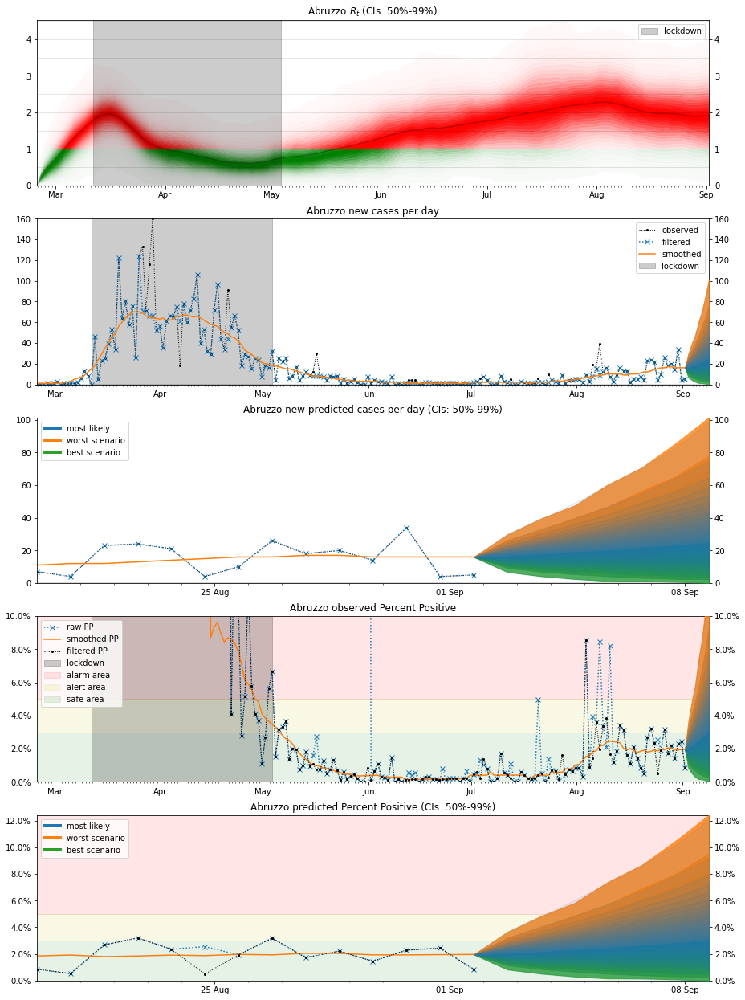

## Basilicata

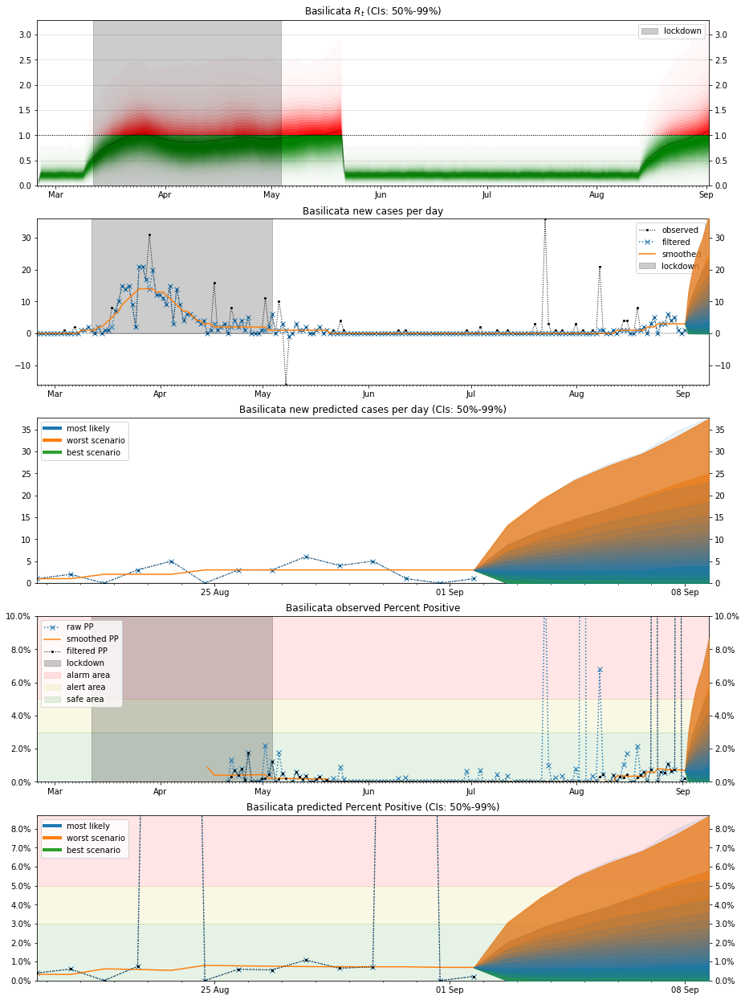

## Calabria

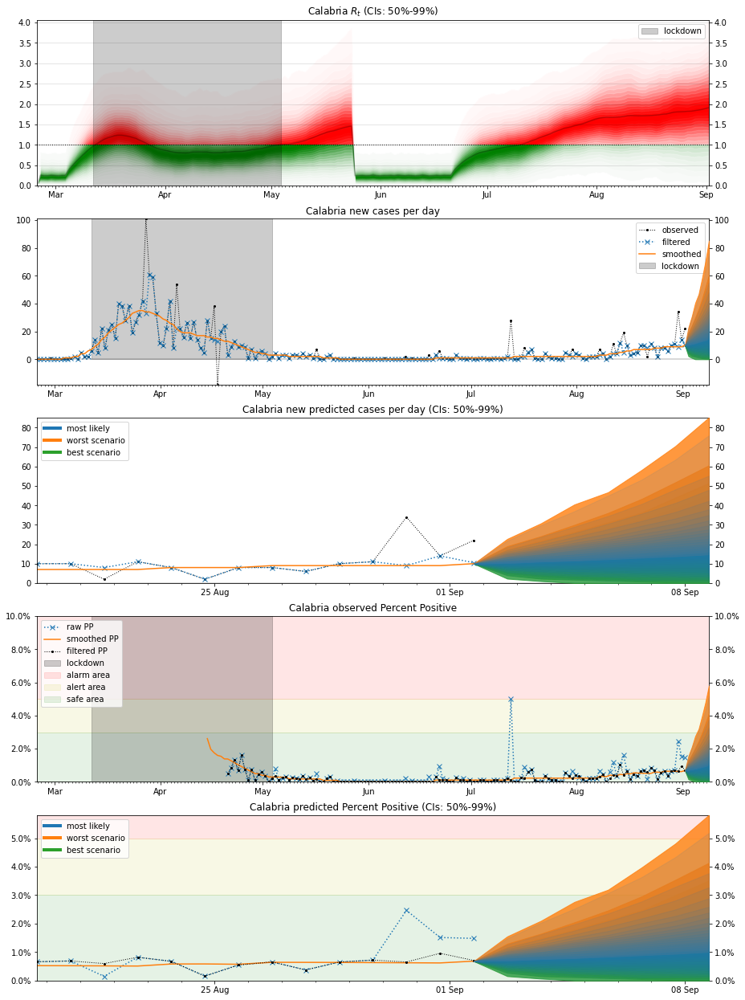

## Campania

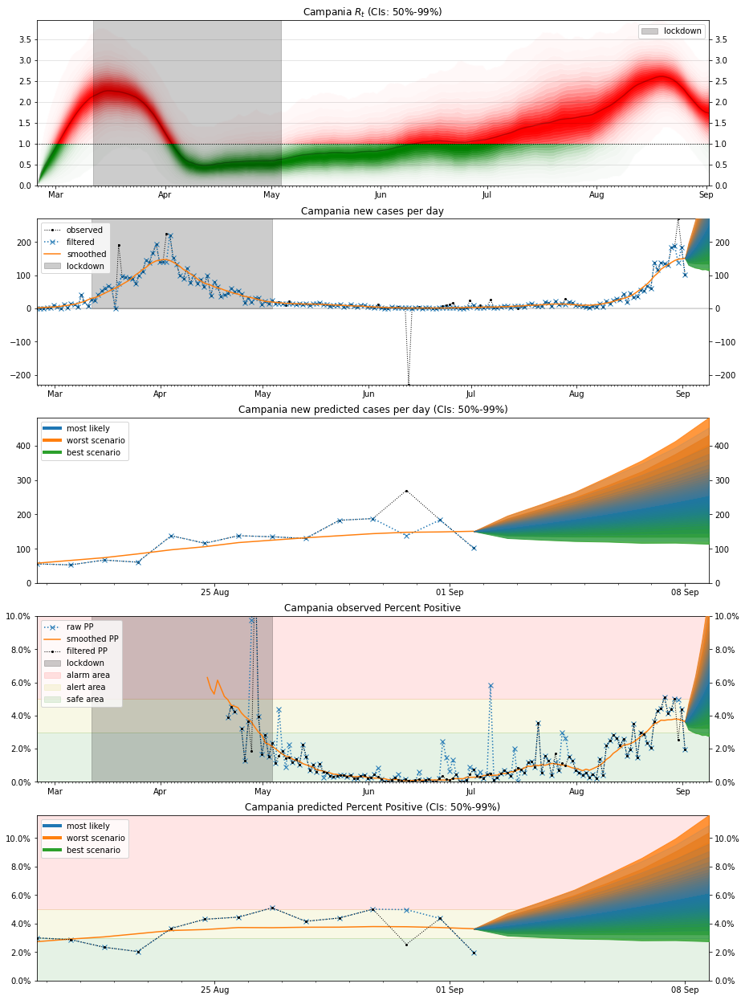

## Emilia-Romagna

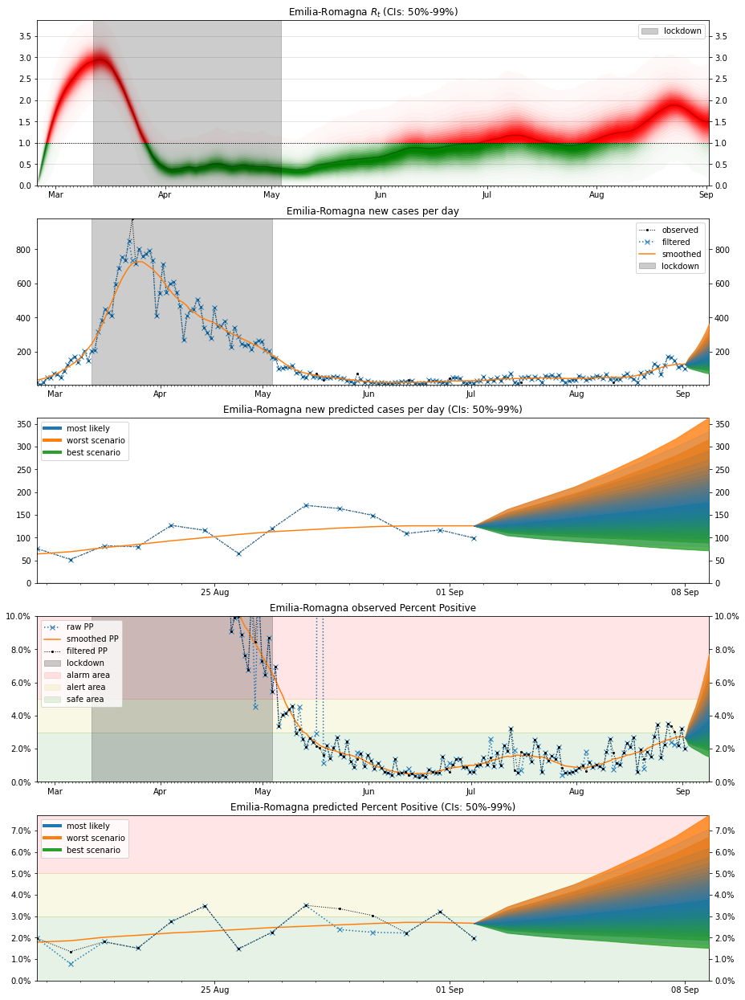

## Friuli Venezia Giulia

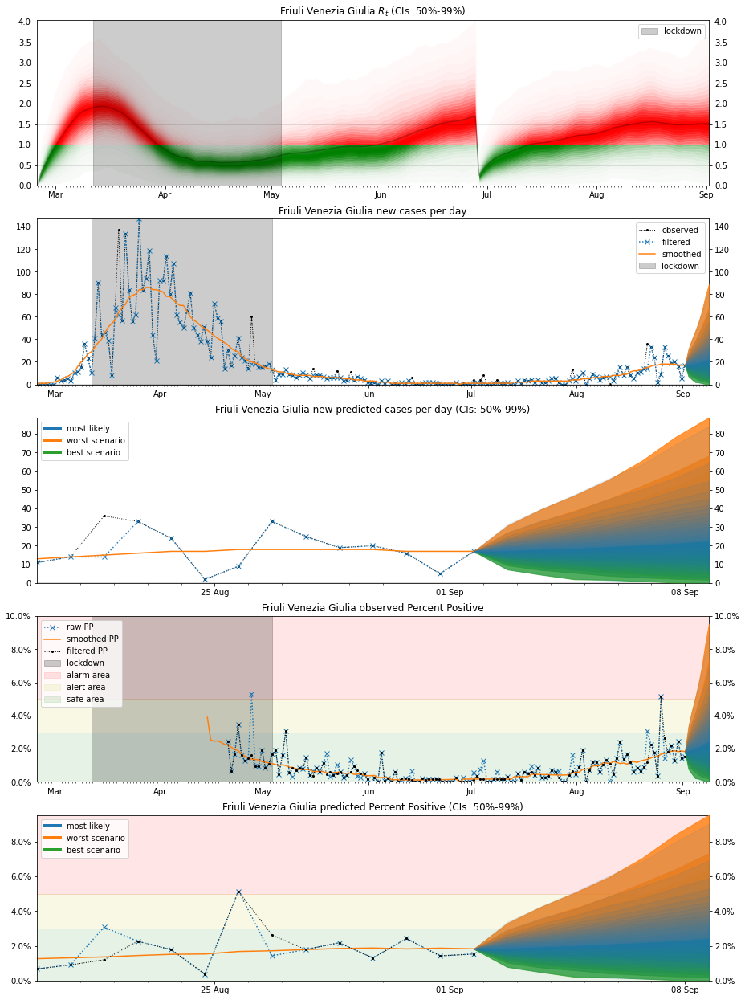

## Lazio

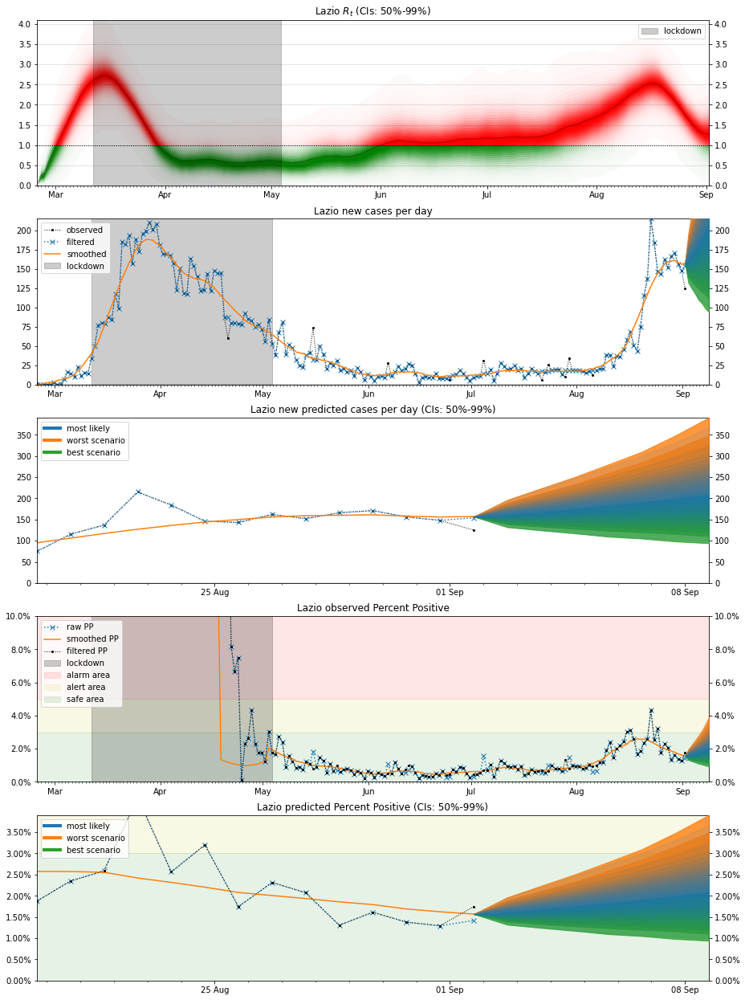

## Liguria

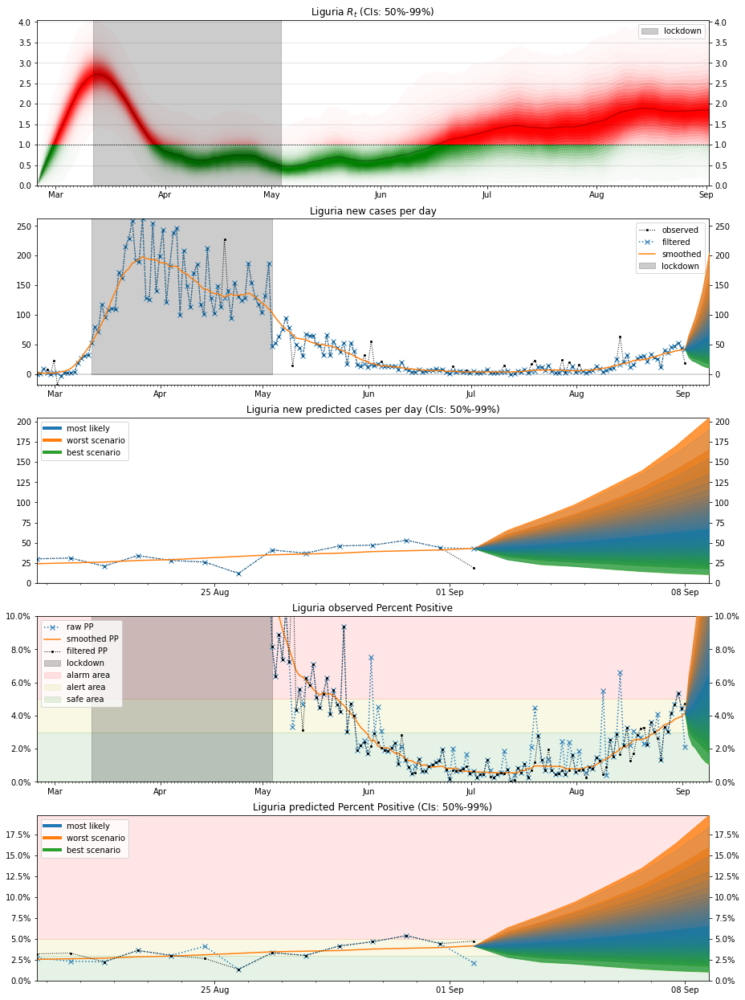

## Lombardia

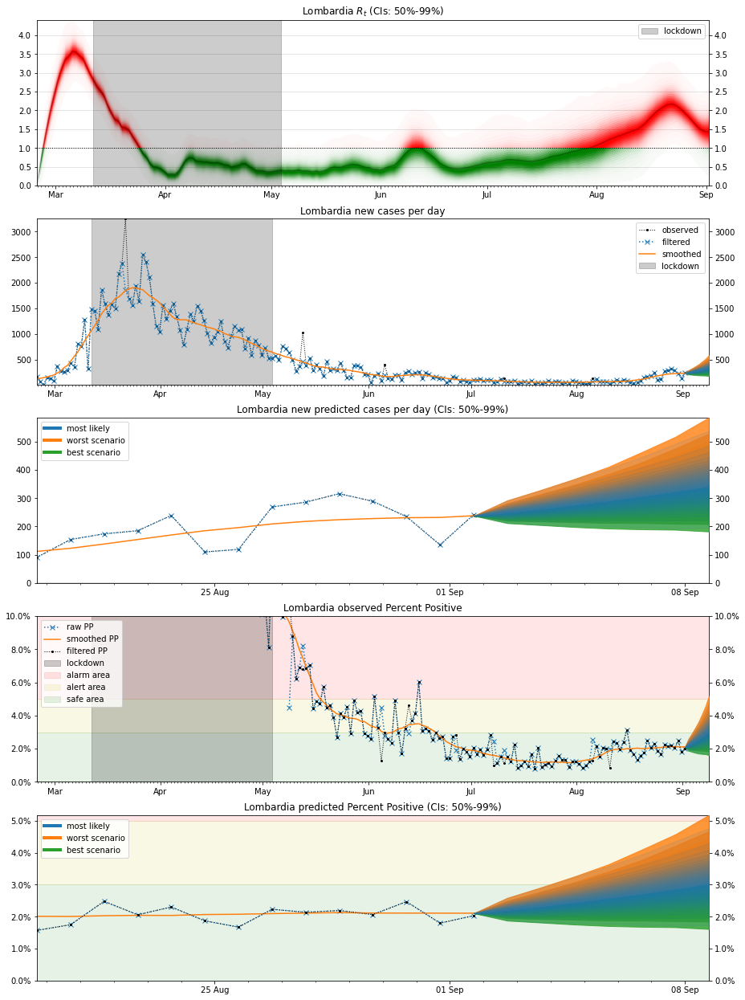

## Marche

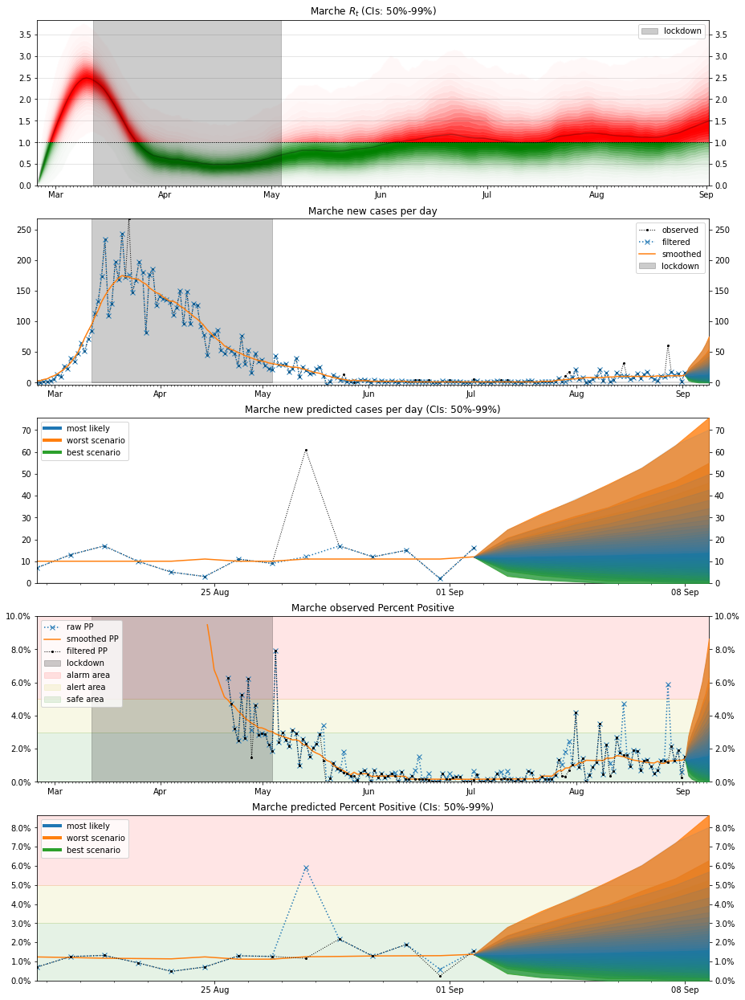

## Molise

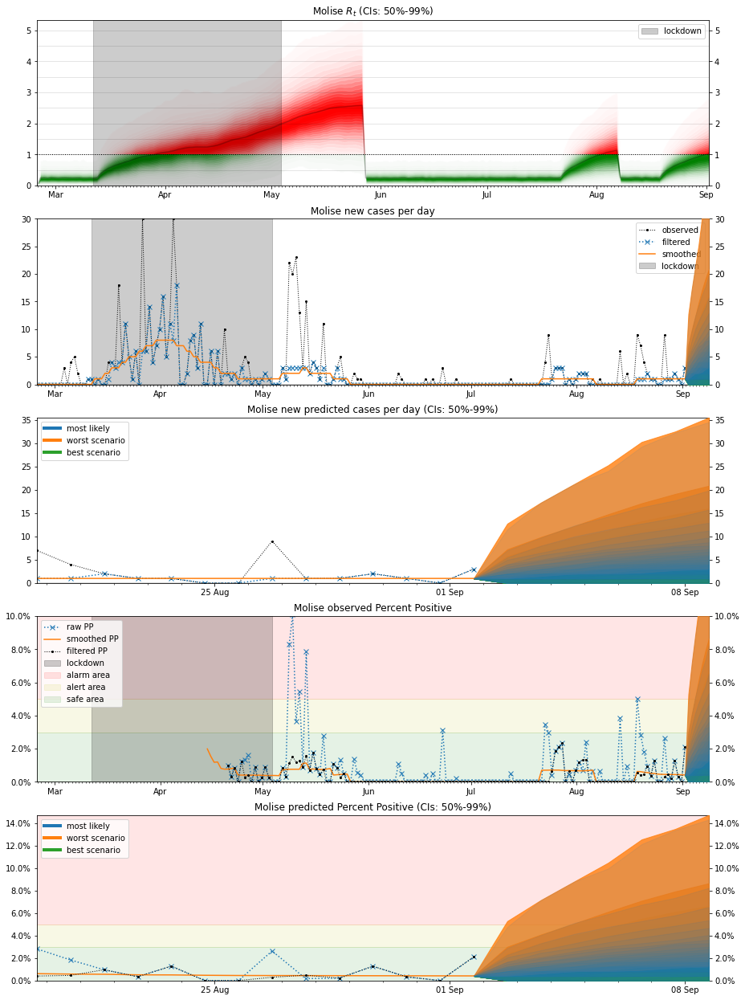

## P.A. Bolzano

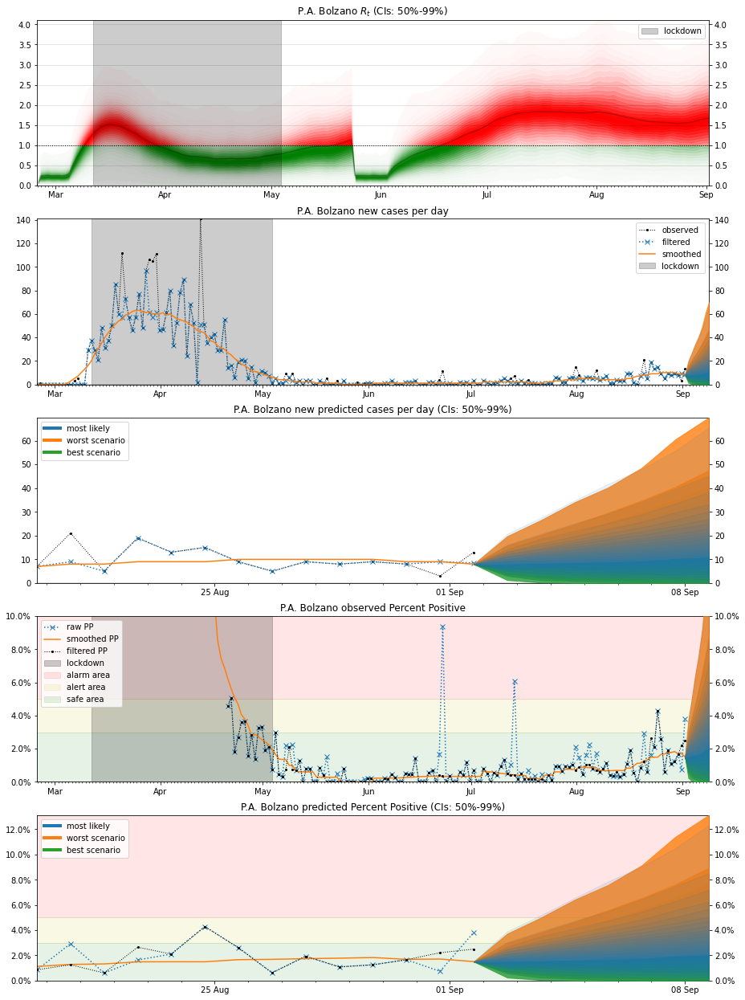

## P.A. Trento

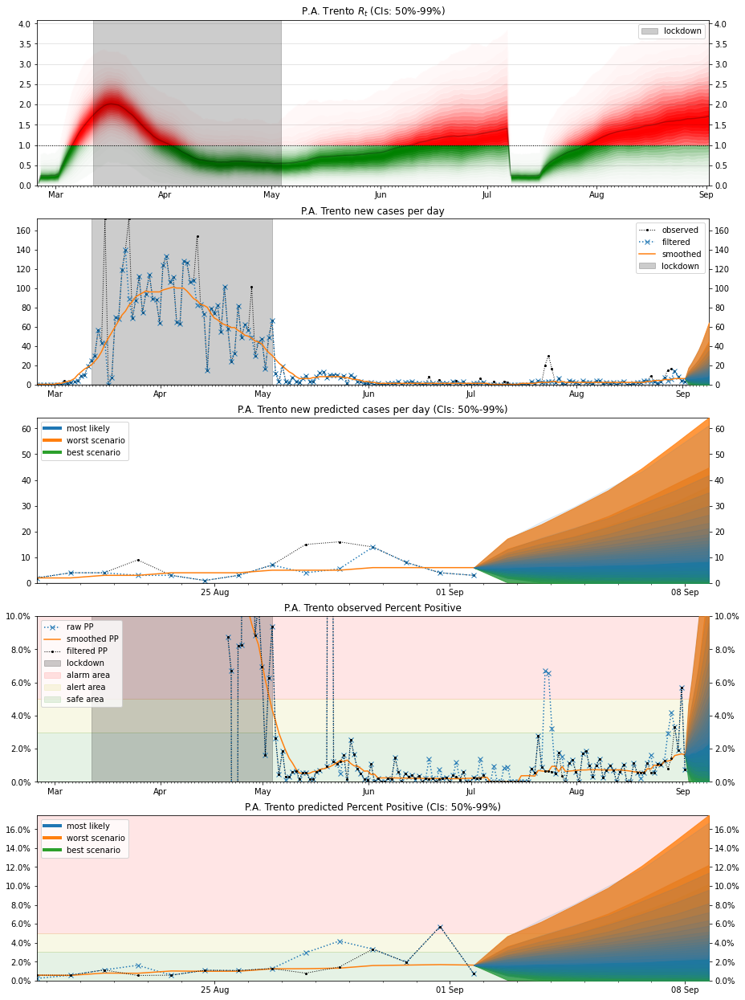

## Piemonte

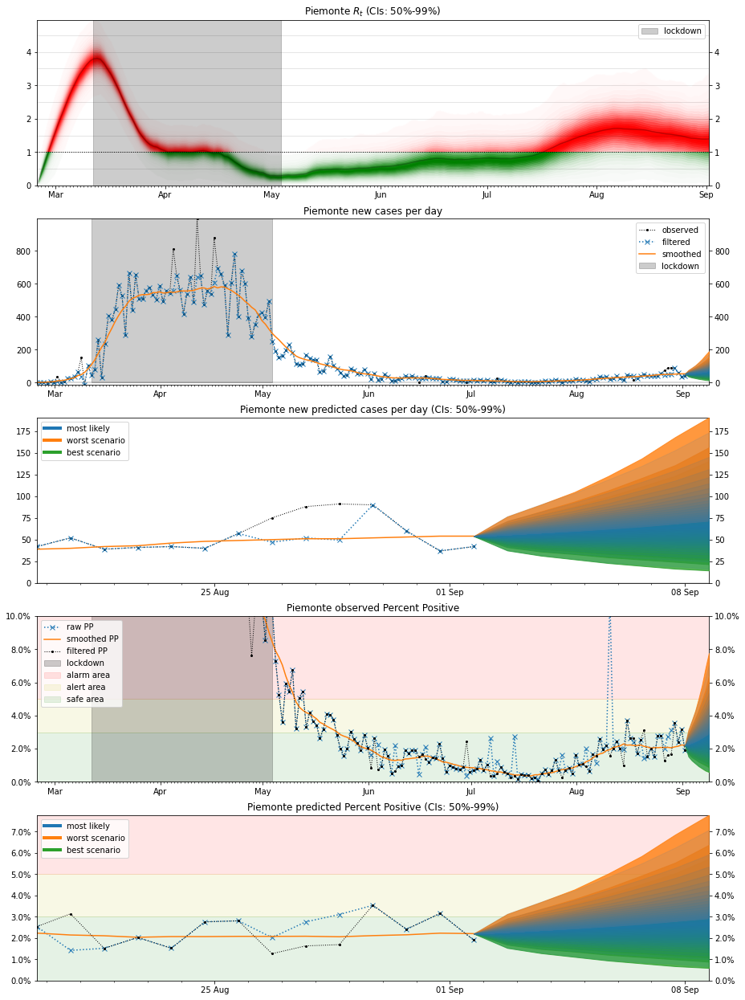

## Puglia

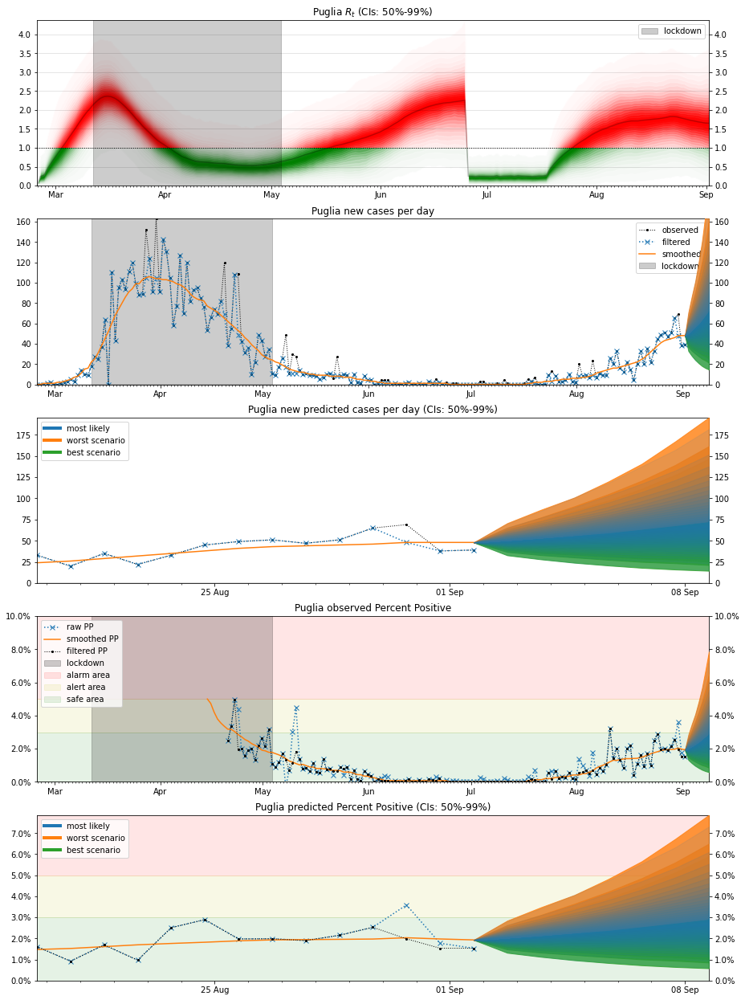

## Sardegna

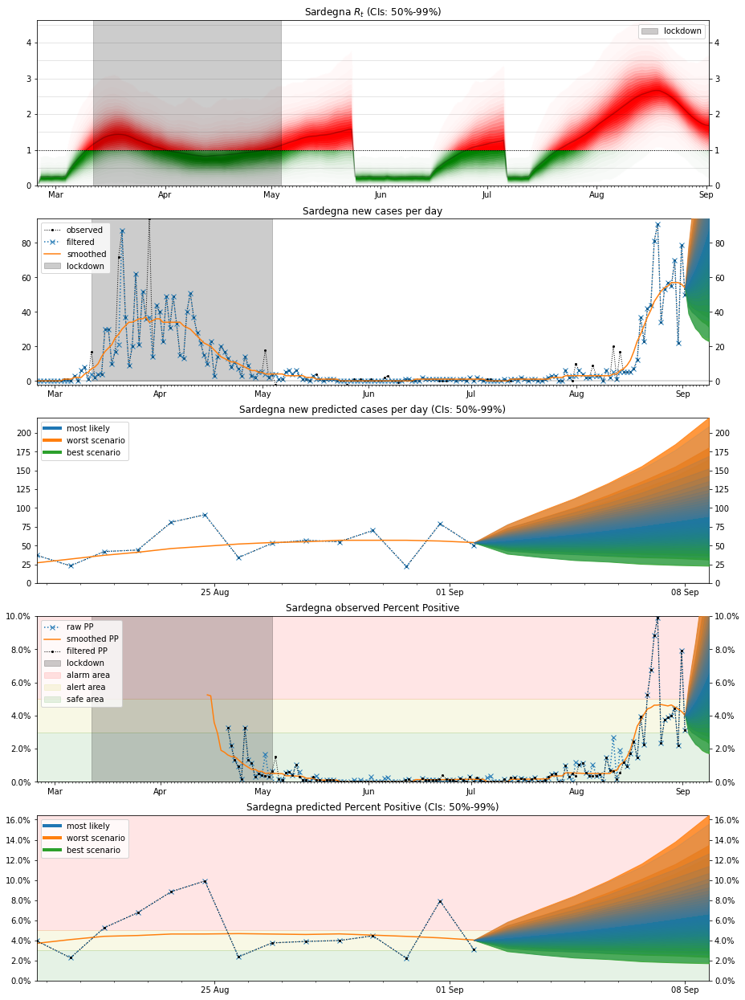

## Sicilia

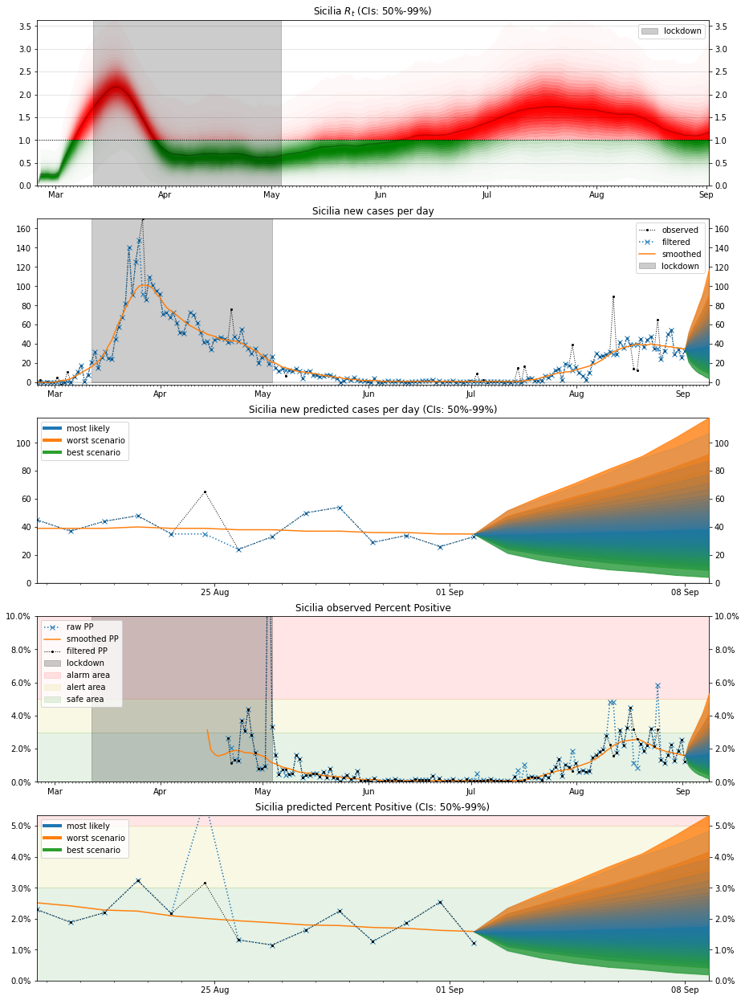

## Toscana

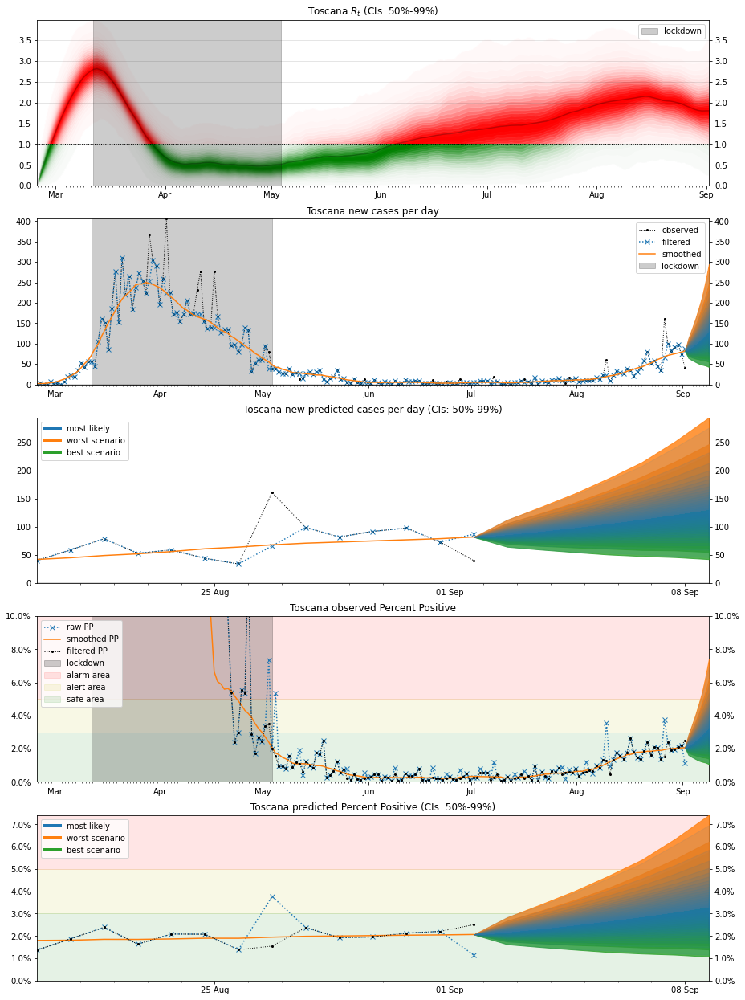

## Umbria

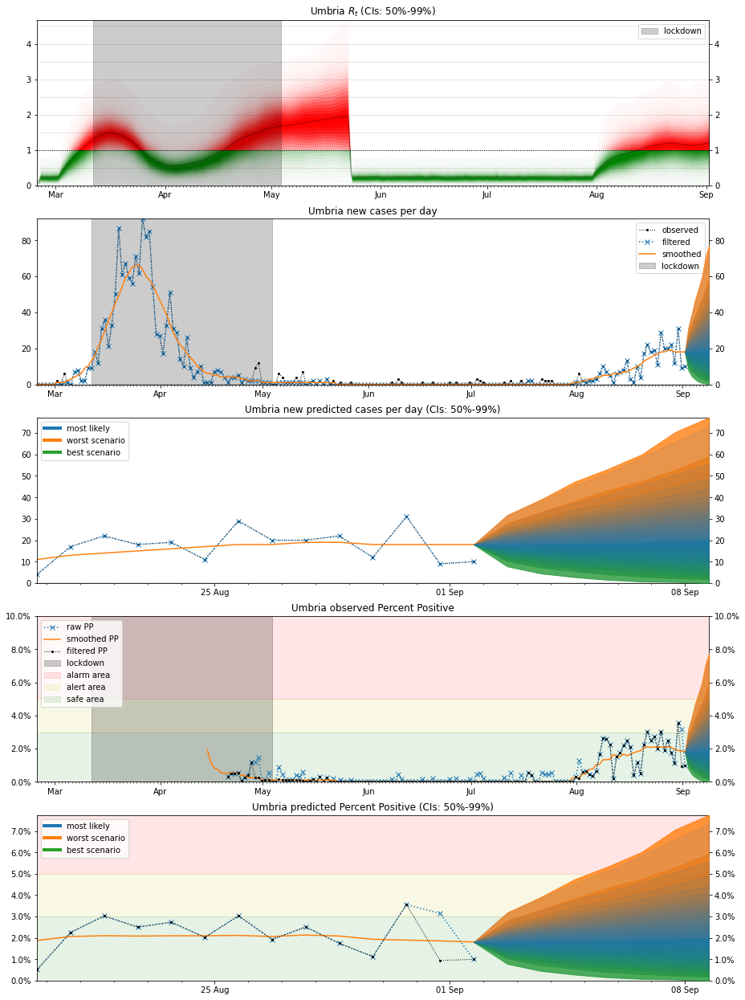

## Valle d'Aosta

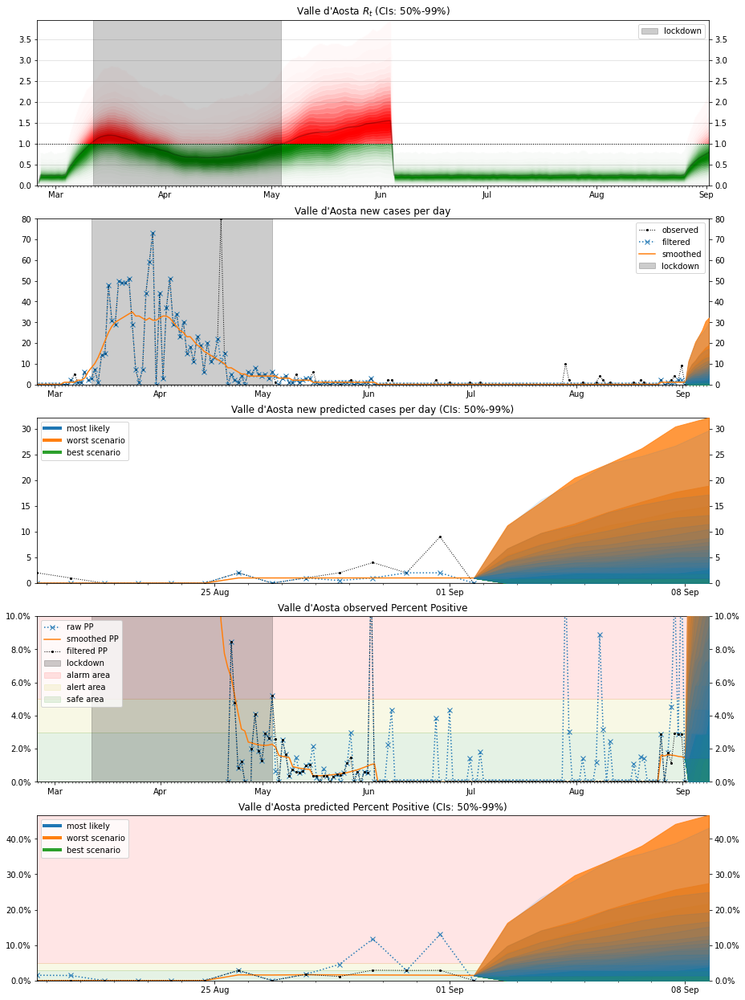

## Veneto

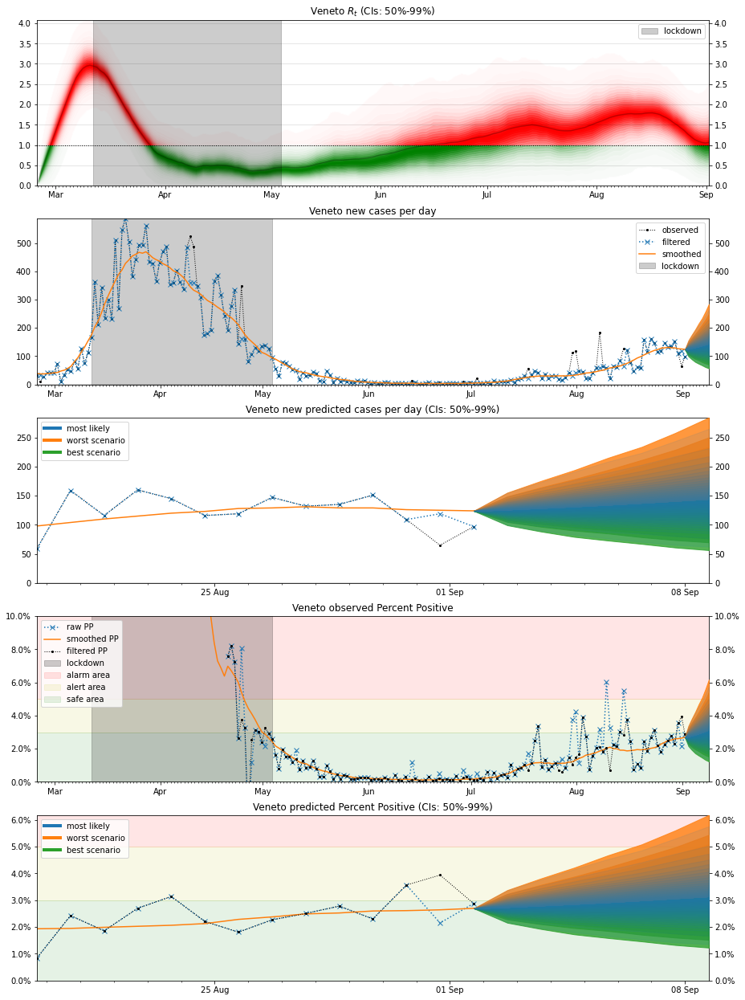

In [25]:
percs = np.linspace(50, 99, 20)

if not jags_posteriors_italy:
    with open("posterior_samples_italy.pkl", "rb") as f:
        jags_posteriors_italy = pickle.load(f)

        
uppers = np.ndarray(shape=(countries.size, len(percs), days.size))
lowers = np.ndarray(shape=(countries.size, len(percs), days.size))
means = np.ndarray(shape=(countries.size, days.size))
pred_means = np.ndarray(shape=(countries.size, prediction+1))
PP_pred_means = np.ndarray(shape=(countries.size, prediction+1))
    
for r, region in enumerate(countries):
    display(Markdown(f"## {region}"))
    
    ymax = np.array([])

    pyjags_data_region = az.from_pyjags({
        "R": jags_posteriors_italy["RR"][r],
        "y_pred": jags_posteriors_italy["yR_pred"][r],
        "PP": jags_posteriors_italy["PPR"][r],
        "y_pred_hi": jags_posteriors_italy["yR_pred_hi"][r],
        "y_pred_lo": jags_posteriors_italy["yR_pred_lo"][r],
        "PP_lo": jags_posteriors_italy["PPR_lo"][r],
        "PP_hi": jags_posteriors_italy["PPR_hi"][r],
    }, warmup_iterations=warmup, save_warmup=False)
    summary = az.summary(pyjags_data_region, var_names="R", kind="stats")
    for i, p in enumerate(percs[::-1]):
        upper = np.percentile(pyjags_data_region.posterior.R, p, axis=1)
        upper = np.mean(upper, axis=0)
        lower = np.percentile(pyjags_data_region.posterior.R, 100-p, axis=1)
        lower = np.mean(lower, axis=0)
        ymax = np.append(ymax, upper.max())
        uppers[r,i] = upper
        lowers[r,i] = lower
    means[r] = summary["mean"]
    pred_means[r] = az.summary(pyjags_data_region, var_names="y_pred", kind="stats")['mean']
    PP_pred_means[r] = az.summary(pyjags_data_region, var_names="PP", kind="stats")['mean']
    ymax = ymax.max()


    fig, ax = plt.subplots(5, 1, figsize=(15, 22))

    pred_days = pd.date_range(days[-1], days[-1]+pd.Timedelta(days=7), freq="1d")

    y_predmax = np.array([])
    PP_max = np.array([])

    for c, pred in enumerate(['', '_hi', '_lo']):
        y_pred = f"y_pred{pred}"
        PP = f"PP{pred}"
        for i, p in enumerate(percs[::-1]):
            y_upper = np.percentile(pyjags_data_region.posterior[y_pred], p, axis=1)
            y_upper = np.mean(y_upper, axis=0)
            PP_upper = np.percentile(pyjags_data_region.posterior[PP], p, axis=1)
            PP_upper = np.mean(PP_upper, axis=0)

            y_lower = np.percentile(pyjags_data_region.posterior[y_pred], 100-p, axis=1)
            y_lower = np.mean(y_lower, axis=0)
            PP_lower = np.percentile(pyjags_data_region.posterior[PP], 100-p, axis=1)
            PP_lower = np.mean(PP_lower, axis=0)

            y_predmax = np.append(y_predmax, y_upper.max())
            PP_max = np.append(PP_max, PP_upper.max())

            alpha=.8
            if not pred:
                alpha = .1
            if pred == '_lo':
                ax[1].fill_between(pred_days, pred_means[r], y_lower, color=f"C{c}", alpha=alpha, zorder=100-c)
                ax[2].fill_between(pred_days, pred_means[r], y_lower, color=f"C{c}", alpha=alpha, zorder=100-c)
                ax[3].fill_between(pred_days, PP_pred_means[r], PP_lower, color=f"C{c}", alpha=alpha, zorder=100-c)
                ax[4].fill_between(pred_days, PP_pred_means[r], PP_lower, color=f"C{c}", alpha=alpha, zorder=100-c)
            elif pred == '_hi':
                ax[1].fill_between(pred_days, pred_means[r], y_upper, color=f"C{c}", alpha=alpha, zorder=100-c)
                ax[2].fill_between(pred_days, pred_means[r], y_upper, color=f"C{c}", alpha=alpha, zorder=100-c)
                ax[3].fill_between(pred_days, PP_pred_means[r], PP_upper, color=f"C{c}", alpha=alpha, zorder=100-c)
                ax[4].fill_between(pred_days, PP_pred_means[r], PP_upper, color=f"C{c}", alpha=alpha, zorder=100-c)
            else:
                ax[1].fill_between(pred_days, y_lower, y_upper, color=f"C{c}", alpha=alpha, zorder=100-c)
                ax[2].fill_between(pred_days, y_lower, y_upper, color=f"C{c}", alpha=alpha, zorder=100-c)
                ax[3].fill_between(pred_days, PP_upper, PP_lower, color=f"C{c}", alpha=alpha, zorder=100-c)
                ax[4].fill_between(pred_days, PP_upper, PP_lower, color=f"C{c}", alpha=alpha, zorder=100-c)

    y_predmax = y_predmax.max()
    PP_max = PP_max.max()
    ax[1].fill_betweenx(
        [0,df.loc[region]['nuovi_positivi'].max()*2],
        days[days>=pd.to_datetime("2020-03-11")][0],
        days[days<=pd.to_datetime("2020-05-04")][-1],
        color="k", alpha=.2, label="lockdown"
    )
    ax[1].plot(days, df.loc[region]['nuovi_positivi'], 'ok:', lw=1, ms=2, label="observed")
    ax[1].plot(days, pos_Y_flt[r], 'x:', label="filtered")
    ax[1].plot(days, pos_Y_smt[r], label="smoothed")
    ax[1].axhline(0, c="k", alpha=.2)
    ax[1].set_xlim(days[0], days[-1]+pd.Timedelta(days=7))
    ax[1].set_ylim(df.loc[region]['nuovi_positivi'].min(), df.loc[region]['nuovi_positivi'].max())
    ax[1].yaxis.set_ticks_position('both')
    ax[1].tick_params(labelright=True)
    ax[1].legend()
    ax[1].set_title(f"{region} new cases per day")

    ax[2].set_ylim(0, y_predmax)
    ax[2].plot(days, df.loc[region]['nuovi_positivi'], 'ok:', lw=1, ms=2, label="observed")
    ax[2].plot(days, pos_Y_flt[r], 'x:', label="filtered")
    ax[2].plot(days, pos_Y_smt[r], label="smoothed")
    ax[2].axhline(0, c="k", alpha=.2)
    ax[2].set_xlim(days[-prediction*2], days[-1]+pd.Timedelta(days=7))
    ax[2].yaxis.set_ticks_position('both')
    ax[2].tick_params(labelright=True)
    custom_lines = [Line2D([0], [0], color="C0", lw=4),
                    Line2D([0], [0], color="C1", lw=4),
                    Line2D([0], [0], color="C2", lw=4)]
    ax[2].legend(
        custom_lines, ['most likely', 'worst scenario', 'best scenario'],
        loc="upper left"
    )
    ax[2].set_title(f"{region} new predicted cases per day (CIs: {percs[0]:.0f}%-{percs[-1]:.0f}%)")

    PP_days = [days[0], pred_days[-1]]
    ax[3].fill_betweenx(
        [0,100],
        days[days>=pd.to_datetime("2020-03-11")][0],
        days[days<=pd.to_datetime("2020-05-04")][-1],
        color="k", alpha=.2, label="lockdown"
    )
    ax[3].fill_between(PP_days, 5, 100, color="r", alpha=.1, label="alarm area", zorder=0)
    ax[3].fill_between(PP_days, 3, 5, color="y", alpha=.1, label="alert area", zorder=0)
    ax[3].fill_between(PP_days, 0, 3, color="g", alpha=.1, label="safe area", zorder=0)
    ax[3].plot(days[1:], PPR_raw[r], 'x:', label="raw PP")
    ax[3].plot(days[1:], PPR_smt[r], label="smoothed PP")
    ax[3].plot(days[1:], PPR_flt[r], 'ok:', lw=1, ms=2, label="filtered PP")
    #ax[3].axhline(5, c="k", zorder=200)
    #ax[3].axhline(3, c="k", ls="--", lw=1, zorder=200)
    ax[3].set_xlim(days[0], pred_days[-1])
    ax[3].set_ylim(0, 10)
    ax[3].yaxis.set_ticks_position('both')
    ax[3].tick_params(labelright=True)
    ax[3].yaxis.set_major_formatter(ticker.PercentFormatter())
    ax[3].legend(loc="upper left")
    ax[3].set_title(f"{region} observed Percent Positive")

    ax[4].set_ylim(0, PP_max)
    ax[4].plot(days[1:], PPR_raw[r], 'x:', label="raw PP")
    ax[4].plot(days[1:], PPR_smt[r], label="smoothed PP")
    ax[4].plot(days[1:], PPR_flt[r], 'ok:', lw=1, ms=2, label="filtered PP")
    ax[4].fill_between(PP_days, 5, 100, color="r", alpha=.1, label="alarm area", zorder=0)
    ax[4].fill_between(PP_days, 3, 5, color="y", alpha=.1, label="alert area", zorder=0)
    ax[4].fill_between(PP_days, 0, 3, color="g", alpha=.1, label="safe area", zorder=0)
    #ax[4].axhline(5, c="k", zorder=200)
    #ax[4].axhline(3, c="k", ls="--", lw=1, zorder=200)
    ax[4].set_xlim(days[-prediction*2], days[-1]+pd.Timedelta(days=7))
    ax[4].yaxis.set_ticks_position('both')
    ax[4].yaxis.set_major_formatter(ticker.PercentFormatter())
    ax[4].tick_params(labelright=True)
    custom_lines = [Line2D([0], [0], color="C0", lw=4),
                    Line2D([0], [0], color="C1", lw=4),
                    Line2D([0], [0], color="C2", lw=4)]
    ax[4].legend(
        custom_lines, ['most likely', 'worst scenario', 'best scenario'],
        loc="upper left"
    )
    ax[4].set_title(f"{region} predicted Percent Positive (CIs: {percs[0]:.0f}%-{percs[-1]:.0f}%)")


    steps = .4/(len(percs)-1)
    for i, (upper, lower) in enumerate(zip(uppers[r], lowers[r])):
        alpha = 1-(i*steps)-(.6*np.ceil(i/len(percs)))
        ax[0].fill_between(days, np.zeros(lower.size), lower, color="w", alpha=alpha)
        ax[0].fill_between(days, upper, np.ones(lower.size)*12, color="w", alpha=alpha)
        
    ax[0].fill_betweenx(
        [0,100],
        days[days>=pd.to_datetime("2020-03-11")][0],
        days[days<=pd.to_datetime("2020-05-04")][-1],
        color="k", alpha=.2, label="lockdown"
    )
        
    ax[0].plot(days, summary["mean"], c="k", alpha=.25)

    ax[0].hlines(np.arange(0, 12, .5), days[0], days[-1], color="k", lw=1, alpha=.1)
    ax[0].axhline(1, c="k", ls=":", lw=1)

    ax[0].fill_between(days, 1, 12, color="red", zorder=0) #, alpha=.2)
    ax[0].fill_between(days, 0, 1, color="green", zorder=0) #, alpha=.2)

    ax[0].set_xlim(days[0], days[-1])

    ax[0].set_title(fr"{region} $R_t$ (CIs: {percs[0]:.0f}%-{percs[-1]:.0f}%)")

    ax[0].set_ylim(0, ymax)
    ax[0].yaxis.set_ticks_position('both')
    ax[0].tick_params(labelright=True)
    ax[0].legend()

    for w in [2,4]:
        ax[w].xaxis.set_major_locator(mdates.WeekdayLocator())
        ax[w].xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
        ax[w].xaxis.set_minor_locator(mdates.DayLocator())
    for w in [0,1,3]:
        ax[w].xaxis.set_major_locator(mdates.MonthLocator())
        ax[w].xaxis.set_major_formatter(mdates.DateFormatter('%b'))
        ax[w].xaxis.set_minor_locator(mdates.DayLocator())

    plt.show()
    plt.close(fig="all")

## Latest Rt

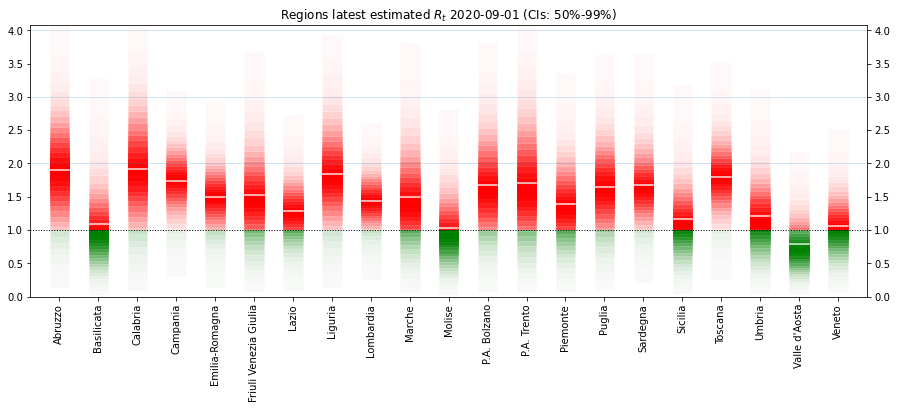

In [26]:
fig, ax = plt.subplots(figsize=(15,5))

for r, region in enumerate(countries):
    steps = .4/(len(percs)-1)
    for i, (upper, lower) in enumerate(zip(uppers[r,:,-1], lowers[r,:,-1])):
        alpha = 1-(i*steps)-(.6*np.ceil(i/len(percs)))
        ax.fill_between([r*2,r*2+1], 1, 12, color="red", zorder=0)
        ax.fill_between([r*2,r*2+1], 0, 1, color="green", zorder=0)
        ax.fill_between(np.linspace(r*2,r*2+1,10), np.zeros(10), lower, color="w", alpha=alpha)
        ax.fill_between(np.linspace(r*2,r*2+1,10), upper, np.ones(10)*12, color="w", alpha=alpha)
    ax.plot(np.linspace(r*2,r*2+1,10), np.ones(10)*means[r][-1], color="w", alpha=.9, zorder=100)

ax.axhline(1, c="k", ls=":", lw=1)
ax.hlines(np.arange(2, 12, 1), -1, countries.size*2+1, lw=1, alpha=.2)
ax.set_ylim(0, ymax)
ax.set_xlim(-1, countries.size*2)
ax.set_xticks(np.arange(.5, countries.size*2+.5, 2))
ax.set_xticklabels(countries.values, rotation=90)
ax.yaxis.set_ticks_position('both')
ax.tick_params(labelright=True)
ax.set_title(f"Regions latest estimated $R_t$ {days[-1].date()} (CIs: {percs[0]:.0f}%-{percs[-1]:.0f}%)")
plt.show();

# MCMC diagnosis

## sigma

In [27]:
pyjags_data_sigma = az.from_pyjags(
    {"sigma_R": jags_posteriors_italy["sigma_R"]}, 
    warmup_iterations=warmup, save_warmup=False)

In [28]:
_ = """display(Latex(az.summary(pyjags_data_sigma, hdi_prob=.99, kind="stats").to_latex()))"""

In [29]:
_ = """display(Latex(az.summary(pyjags_data_sigma, hdi_prob=.99, kind="diagnostics").to_latex()))"""

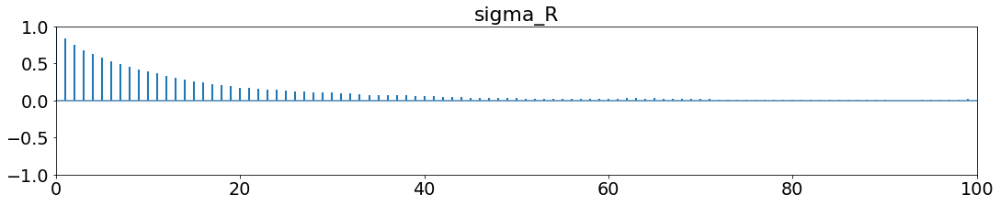

In [30]:
ax = az.plot_autocorr(
    pyjags_data_sigma,
    combined=True,
    max_lag=100,
    figsize=(15,3)
)
plt.show()
plt.close(fig="all")

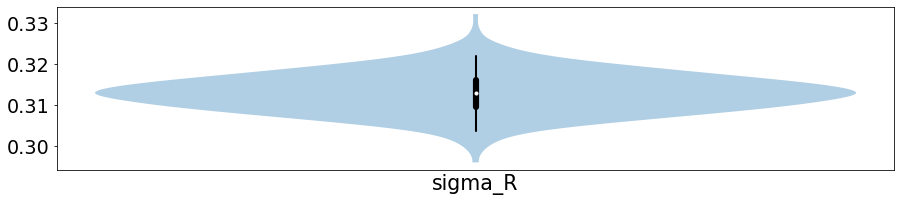

In [31]:
ax = az.plot_violin(
    pyjags_data_sigma,
    figsize=(15,3)
)
plt.show()
plt.close(fig="all")

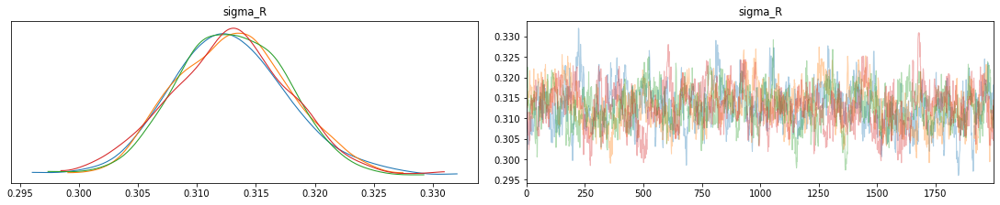

In [32]:
ax = az.plot_trace(
    pyjags_data_sigma,
    figsize=(15,3)
)
plt.show()
plt.close(fig="all")

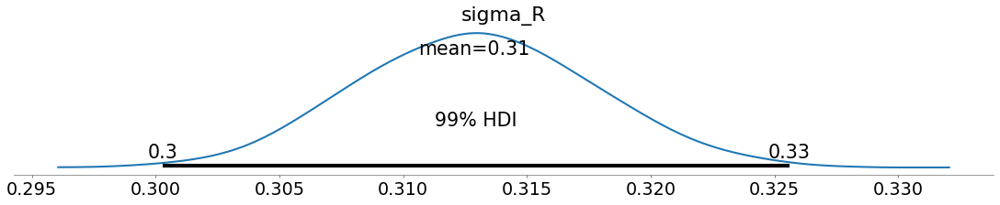

In [33]:
ax = az.plot_posterior(
    pyjags_data_sigma,
    hdi_prob=.99,
    figsize=(15,3)
)
plt.show()
plt.close(fig="all")

## Rt

In [34]:
auto_it = az.autocorr(jags_posteriors_italy["R"][:,warmup:,:], axis=1)

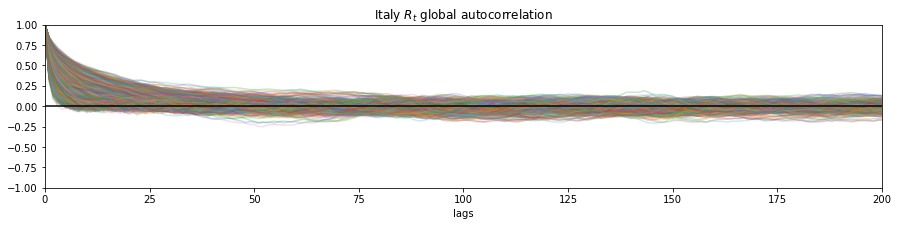

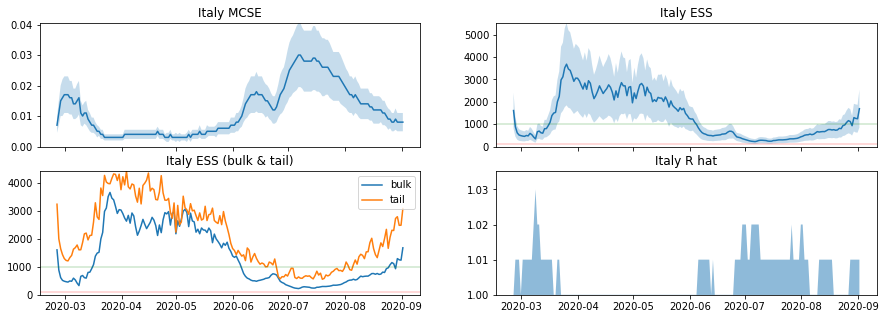

In [35]:
fig, ax = plt.subplots(figsize=(15, 3))
for day in auto_it:
    ax.plot(day[:,:], alpha=.25)
ax.set_xlim(0, 200)
ax.set_ylim(-1, 1)
ax.axhline(0, c="k")
ax.set_xlabel("lags")
ax.set_title("Italy $R_t$ global autocorrelation")
plt.show();

pyjags_data_R = az.from_pyjags(
{"R": jags_posteriors_italy["R"][1:,:,:]}, 
warmup_iterations=warmup, save_warmup=False)
smry = az.summary(pyjags_data_R, hdi_prob=.99)

fig, ax = plt.subplots(2, 2, figsize=(15, 5), sharex=True)
ax[0,0].plot(days[1:], smry["mcse_mean"])
ax[0,0].fill_between(
    days[1:],
    smry["mcse_mean"]-smry["mcse_sd"]/2,
    smry["mcse_mean"]+smry["mcse_sd"]/2,
    alpha=.25
)
ax[0,0].set_ylim(0, (smry["mcse_mean"]+smry["mcse_sd"]/2).max())
ax[0,0].set_title(f"Italy MCSE")

ax[0,1].plot(days[1:], smry["ess_mean"])
ax[0,1].fill_between(
    days[1:],
    smry["ess_mean"]-smry["ess_sd"]/2,
    smry["ess_mean"]+smry["ess_sd"]/2,
    alpha=.25
)
ax[0,1].axhline(100, c="r", alpha=.2)
ax[0,1].axhline(1000, c="g", alpha=.2)
ax[0,1].set_ylim(0, (smry["ess_mean"]+smry["ess_sd"]/2).max())
ax[0,1].set_title(f"Italy ESS")

ax[1,0].plot(days[1:], smry["ess_bulk"], label="bulk")
ax[1,0].plot(days[1:], smry["ess_tail"], label="tail")
ax[1,0].axhline(100, c="r", alpha=.2)
ax[1,0].axhline(1000, c="g", alpha=.2)
ax[1,0].set_ylim(0, max(smry['ess_bulk'].max(), smry['ess_tail'].max()))
ax[1,0].legend()
ax[1,0].set_title(f"Italy ESS (bulk & tail)")

ax[1,1].fill_between(days[1:], 0, smry["r_hat"], alpha=.5)
ax[1,1].set_ylim(smry["r_hat"].min(), smry["r_hat"].max()*1.005)
ax[1,1].set_title(f"Italy R hat")
plt.show()
plt.close(fig="all")

# Prediction tests

In [36]:
modelStringItalyPred = f"""
model {{
    ###################################
    # Rt estimation
    ###################################
    # Overarching Rt standard deviation
    tau_R ~ dgamma( 1000 , 100 )
    sigma_R <- 1 / sqrt( tau_R )

    # Serial interval distribution
    SI_mu <- {SI_mu}
    SI_sd <- {SI_sd}
    SI_sh <- SI_mu^2 / SI_sd^2
    SI_ra <- SI_mu / SI_sd^2
    SI ~ dgamma( SI_sh , SI_ra )
    gamma <- 1 / SI
    
    # First Rt prior
    R[1] <- 0
    for ( t in 2:T ) {{
        # Rt prior for k>0
        Rpr[t] ~ dnorm( R[t-1] , tau_R )  T(0,)
        # Rt prior for k=0
        Rnu[t] ~ dnorm( 0 , tau_R )  T(0,)

        # Define Rt prior
        R[t] <- ifelse( k[t-1]==0 , Rnu[t] , Rpr[t] )
        # Avoid k=0 (undefined Rt)
        K[t] <- ifelse( k[t-1]==0, 1 , k[t-1] )

        # Poisson likelihood
        lambda[t] <- K[t] * exp( gamma * ( R[t] - 1 ) )
        y[t] ~ dpois( lambda[t] )
    }}
    
    ###################################
    # Predictions
    ###################################
    # New cases precision prior
    y_tau ~ dgamma( 1 , 1 )
    
    for ( t in U:(T-1)) {{
        R_pred[t] <- sum(R[(t-P):t]) / P
        y_pred[t,1] <- y[t]
        y_pred_hi[t,1] <- y[t]
        y_pred_lo[t,1] <- y[t]
        PP[t,1] <- PPobs[t]
        PP_lo[t,1] <- PPobs[t]
        PP_hi[t,1] <- PPobs[t]

        for ( p in 2:P ) {{
            R_pred_hi[t,p] <- R_pred[t] + {epsilon} * (p-1) / (P-1)
            R_pred_lo[t,p] <- R_pred[t] - {epsilon} * (p-1) / (P-1)
        
            # most likely scenario
            y_prior[t,p] ~ dnorm( y_pred[t,(p-1)] , y_tau )  T(0,)
            lambda_pred[t,p] <- y_prior[t,p] * exp( gamma * ( R_pred[t] - 1 ) )
            y_pred[t,p] ~ dpois( lambda_pred[t,p] )
            PP[t,p] <- y_pred[t,p] / tests[t] * 100

            # worst scenario
            y_prior_hi[t,p] ~ dnorm( y_pred_hi[t,(p-1)] , y_tau )  T(0,)
            lambda_pred_hi[t,p] <- y_prior_hi[t,p] * exp( gamma * ( R_pred_hi[t,p] - 1 ) )
            y_pred_hi[t,p] ~ dpois( lambda_pred_hi[t,p] )
            PP_hi[t,p] <- y_pred_hi[t,p] / tests[t] * 100

            # best scenario
            y_prior_lo[t,p] ~ dnorm( y_pred_lo[t,(p-1)] , y_tau )  T(0,)
            lambda_pred_lo[t,p] <- y_prior_lo[t,p] * exp( gamma * ( R_pred_lo[t,p] - 1 ) )
            y_pred_lo[t,p] ~ dpois( lambda_pred_lo[t,p] )
            PP_lo[t,p] <- y_pred_lo[t,p] / tests[t] * 100
        }}
    }}
}}
"""

In [37]:
display(Markdown(f"```R\n{modelStringItalyPred}\n```"))

```R

model {
    ###################################
    # Rt estimation
    ###################################
    # Overarching Rt standard deviation
    tau_R ~ dgamma( 1000 , 100 )
    sigma_R <- 1 / sqrt( tau_R )

    # Serial interval distribution
    SI_mu <- 7.5
    SI_sd <- 3.4
    SI_sh <- SI_mu^2 / SI_sd^2
    SI_ra <- SI_mu / SI_sd^2
    SI ~ dgamma( SI_sh , SI_ra )
    gamma <- 1 / SI
    
    # First Rt prior
    R[1] <- 0
    for ( t in 2:T ) {
        # Rt prior for k>0
        Rpr[t] ~ dnorm( R[t-1] , tau_R )  T(0,)
        # Rt prior for k=0
        Rnu[t] ~ dnorm( 0 , tau_R )  T(0,)

        # Define Rt prior
        R[t] <- ifelse( k[t-1]==0 , Rnu[t] , Rpr[t] )
        # Avoid k=0 (undefined Rt)
        K[t] <- ifelse( k[t-1]==0, 1 , k[t-1] )

        # Poisson likelihood
        lambda[t] <- K[t] * exp( gamma * ( R[t] - 1 ) )
        y[t] ~ dpois( lambda[t] )
    }
    
    ###################################
    # Predictions
    ###################################
    # New cases precision prior
    y_tau ~ dgamma( 1 , 1 )
    
    for ( t in U:(T-1)) {
        R_pred[t] <- sum(R[(t-P):t]) / P
        y_pred[t,1] <- y[t]
        y_pred_hi[t,1] <- y[t]
        y_pred_lo[t,1] <- y[t]
        PP[t,1] <- PPobs[t]
        PP_lo[t,1] <- PPobs[t]
        PP_hi[t,1] <- PPobs[t]

        for ( p in 2:P ) {
            R_pred_hi[t,p] <- R_pred[t] + 0.33 * (p-1) / (P-1)
            R_pred_lo[t,p] <- R_pred[t] - 0.33 * (p-1) / (P-1)
        
            # most likely scenario
            y_prior[t,p] ~ dnorm( y_pred[t,(p-1)] , y_tau )  T(0,)
            lambda_pred[t,p] <- y_prior[t,p] * exp( gamma * ( R_pred[t] - 1 ) )
            y_pred[t,p] ~ dpois( lambda_pred[t,p] )
            PP[t,p] <- y_pred[t,p] / tests[t] * 100

            # worst scenario
            y_prior_hi[t,p] ~ dnorm( y_pred_hi[t,(p-1)] , y_tau )  T(0,)
            lambda_pred_hi[t,p] <- y_prior_hi[t,p] * exp( gamma * ( R_pred_hi[t,p] - 1 ) )
            y_pred_hi[t,p] ~ dpois( lambda_pred_hi[t,p] )
            PP_hi[t,p] <- y_pred_hi[t,p] / tests[t] * 100

            # best scenario
            y_prior_lo[t,p] ~ dnorm( y_pred_lo[t,(p-1)] , y_tau )  T(0,)
            lambda_pred_lo[t,p] <- y_prior_lo[t,p] * exp( gamma * ( R_pred_lo[t,p] - 1 ) )
            y_pred_lo[t,p] ~ dpois( lambda_pred_lo[t,p] )
            PP_lo[t,p] <- y_pred_lo[t,p] / tests[t] * 100
        }
    }
}

```

In [38]:
prediction = 7
U = ((it['casi_testati']>0).values).nonzero()[0][0]

model_data_italy_pred = {
    "y": pos_it_smt.values,
    "k": pos_it_smt.values,
    "T": days.size,
    "P": prediction+1,
    "tests": tst_it_smt.values,
    "PPobs": PP_smt,
    "U": U
}

In [39]:
print("Starting MCMC...")

jags_model_italy_pred = pyjags.Model(
    code=modelStringItalyPred, 
    data=model_data_italy_pred,
    chains=4, 
    adapt=adapt,
    progress_bar=True
)

jags_posteriors_italy_pred = jags_model_italy_pred.sample(
    warmup + sample, vars=["R", "sigma_R", "y_pred", "y_pred_hi", "y_pred_lo", "PP", "PP_hi", "PP_lo"]
)

clear_output()

_ = """with open("posterior_samples_italy_pred.pkl", "wb") as f:
    pickle.dump(jags_posteriors_italy_pred, f)"""

## New cases

Legenda:

- dotted black line: observed new cases
- solid blu line: smoothed new cases
- blu area: most likely predicted new cases HPDI 90%
- green area: best scenario predicted new cases HPDI 99%
- orange area: worst scenario predicted new cases HPDI 99%

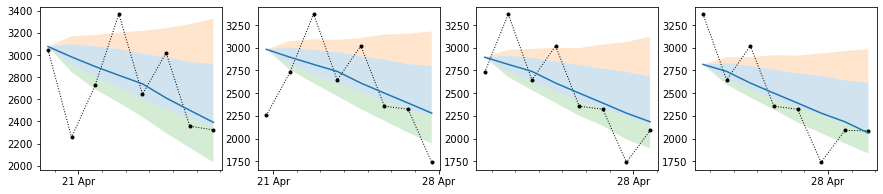

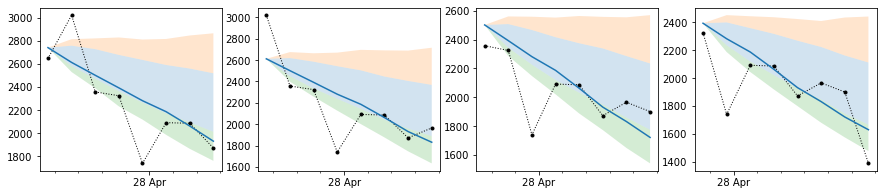

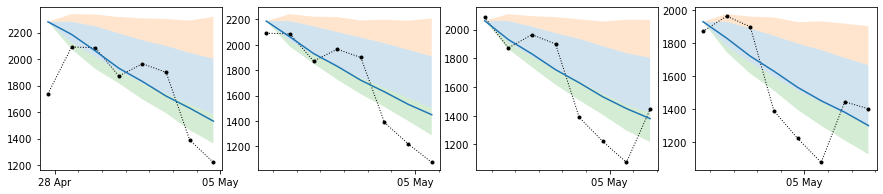

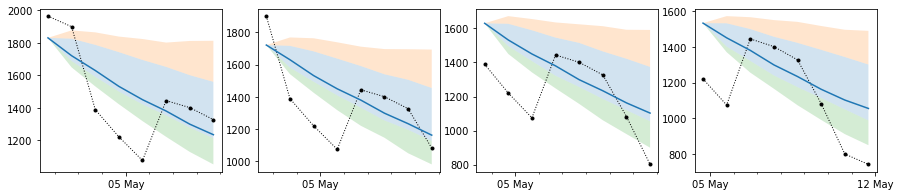

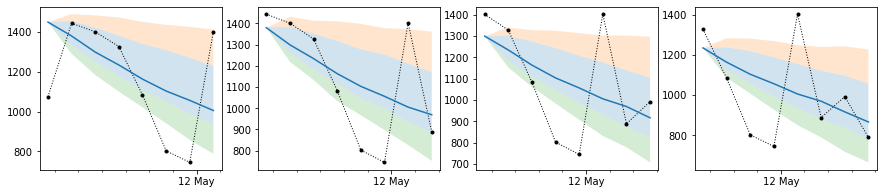

...

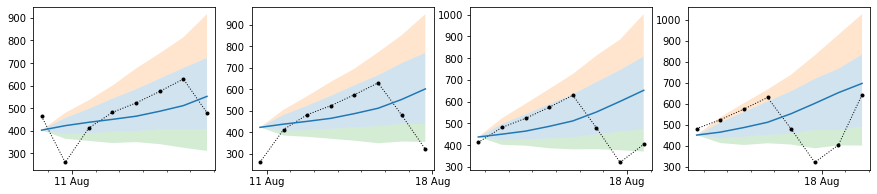

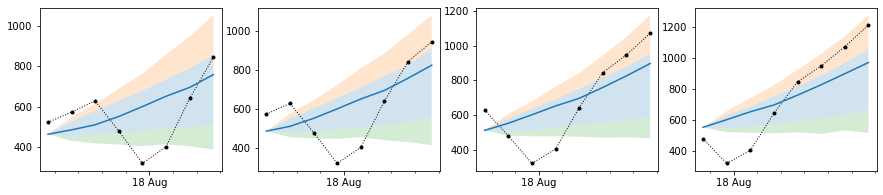

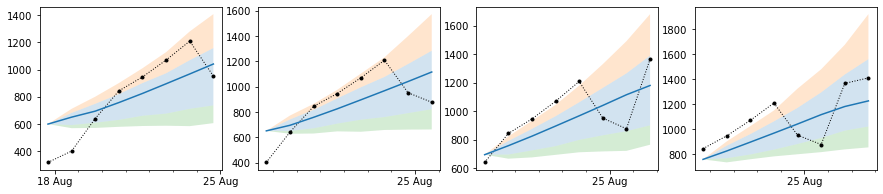

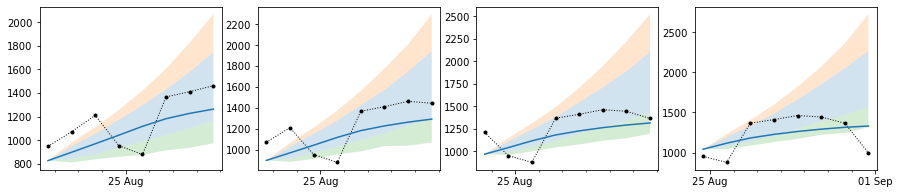

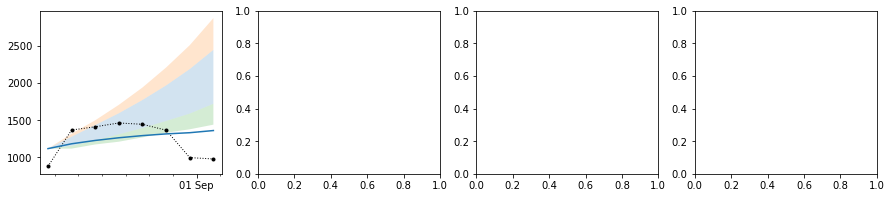

In [40]:
rows = 4

for i, u in enumerate(np.arange(U, (days.size-prediction), 1)):
    if not i % rows:
        fig, ax = plt.subplots(1, rows, figsize=(15, 3))
        
    pyjags_data_italy_pred = az.from_pyjags(
        {'y_pred': jags_posteriors_italy_pred['y_pred'].data[u]}, warmup_iterations=warmup, save_warmup=False
    )
    pyjags_data_italy_pred_hi = az.from_pyjags(
        {'y_pred': jags_posteriors_italy_pred['y_pred_hi'].data[u]}, warmup_iterations=warmup, save_warmup=False
    )
    pyjags_data_italy_pred_lo = az.from_pyjags(
        {'y_pred': jags_posteriors_italy_pred['y_pred_lo'].data[u]}, warmup_iterations=warmup, save_warmup=False
    )
    smry = az.summary(pyjags_data_italy_pred, hdi_prob=.9, kind="stats")
    smry_hi = az.summary(pyjags_data_italy_pred_hi, hdi_prob=.99, kind="stats")
    smry_lo = az.summary(pyjags_data_italy_pred_lo, hdi_prob=.99, kind="stats")
    
    ax[i%rows].plot(
        it.iloc[u:(u+prediction+1)]['nuovi_positivi'],
        'ok:', lw=1, ms=3
    )
    ax[i%rows].plot(
        it.index[u:(u+prediction+1)],
        pos_it_smt[u:(u+prediction+1)]
    )
    ax[i%rows].fill_between(
        it.index[u:(u+prediction+1)],
        smry['hdi_5%'], smry['hdi_95%'],
        alpha=.2
    )
    ax[i%rows].fill_between(
        it.index[u:(u+prediction+1)],
        smry['hdi_95%'], smry_hi['hdi_99.5%'],
        alpha=.2
    )
    ax[i%rows].fill_between(
        it.index[u:(u+prediction+1)],
        smry_lo['hdi_0.5%'], smry['hdi_5%'],
        alpha=.2
    )
    ax[i%rows].xaxis.set_major_locator(mdates.WeekdayLocator())
    ax[i%rows].xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
    ax[i%rows].xaxis.set_minor_locator(mdates.DayLocator())
    
    if i % rows == rows - 1:
        plt.show()
        plt.close(fig="all")

## Percent Positive

Legenda:

- dotted black line: observed Percent Positive
- solid blu line: smoothed Percent Positive
- blu area: most likely predicted Percent Positive HPDI 90%
- green area: best scenario predicted Percent Positive HPDI 99%
- orange area: worst scenario predicted Percent Positive HPDI 99%

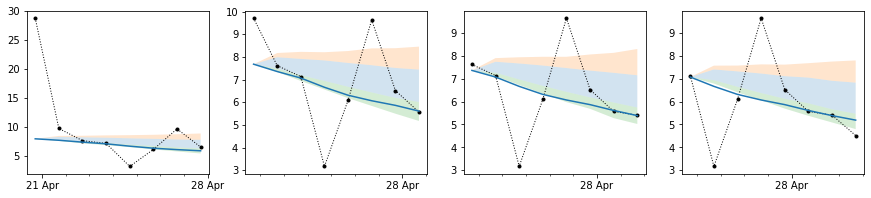

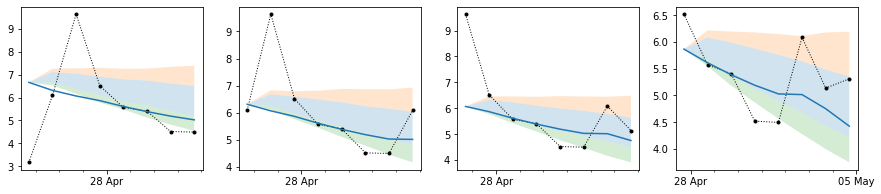

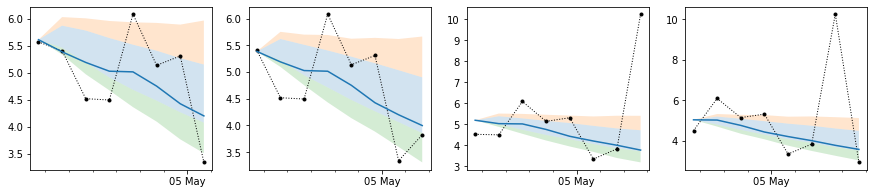

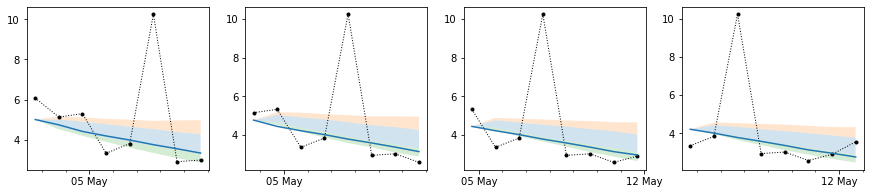

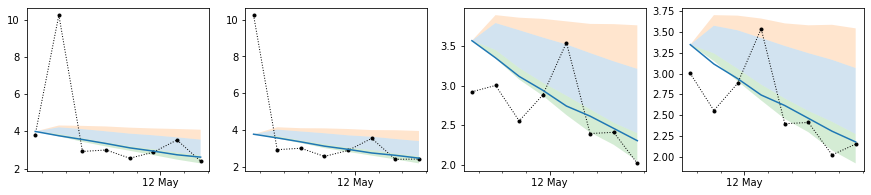

...

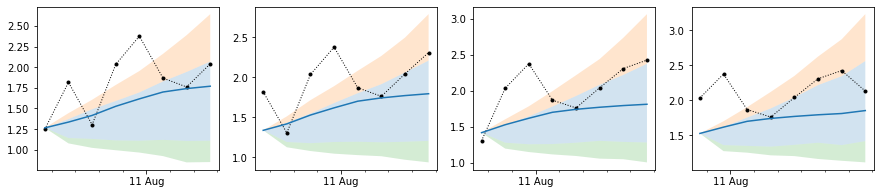

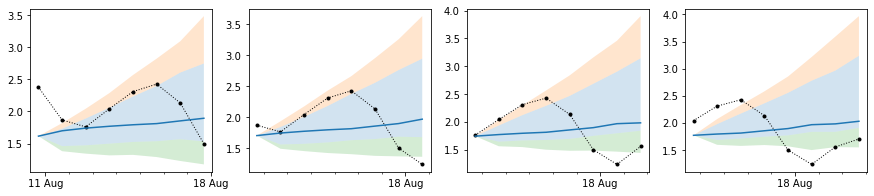

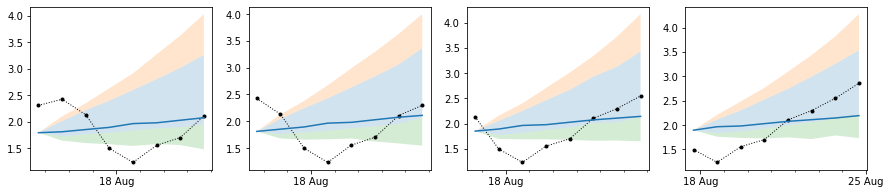

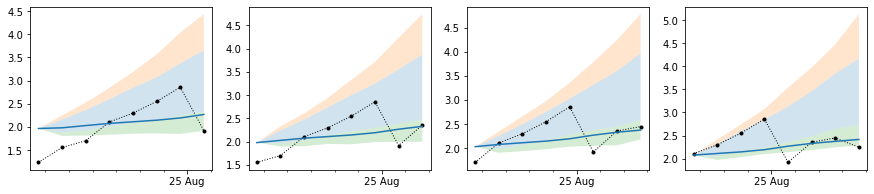

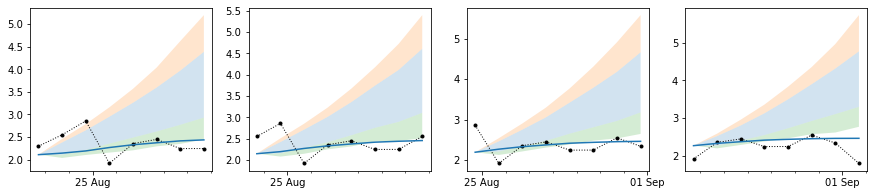

In [41]:
rows = 4

for i, u in enumerate(np.arange(U, (days.size-prediction-1), 1)):
    if not i % rows:
        fig, ax = plt.subplots(1, rows, figsize=(15, 3))
        
    pyjags_data_italy_pred = az.from_pyjags(
        {'PP': jags_posteriors_italy_pred['PP'].data[u]}, warmup_iterations=warmup, save_warmup=False
    )
    pyjags_data_italy_pred_hi = az.from_pyjags(
        {'PP': jags_posteriors_italy_pred['PP_hi'].data[u]}, warmup_iterations=warmup, save_warmup=False
    )
    pyjags_data_italy_pred_lo = az.from_pyjags(
        {'PP': jags_posteriors_italy_pred['PP_lo'].data[u]}, warmup_iterations=warmup, save_warmup=False
    )
    smry = az.summary(pyjags_data_italy_pred, hdi_prob=.9, kind="stats")
    smry_hi = az.summary(pyjags_data_italy_pred_hi, hdi_prob=.99, kind="stats")
    smry_lo = az.summary(pyjags_data_italy_pred_lo, hdi_prob=.99, kind="stats")
    
    ax[i%rows].plot(
        PP_raw.iloc[u:(u+prediction+1)],
        'ok:', lw=1, ms=3
    )
    ax[i%rows].plot(
        PP_raw.index[u:(u+prediction+1)],
        PP_smt[u:(u+prediction+1)]
    )
    ax[i%rows].fill_between(
        PP_raw.index[u:(u+prediction+1)],
        smry['hdi_5%'], smry['hdi_95%'],
        alpha=.2
    )
    ax[i%rows].fill_between(
        PP_raw.index[u:(u+prediction+1)],
        smry['hdi_95%'], smry_hi['hdi_99.5%'],
        alpha=.2
    )
    ax[i%rows].fill_between(
        PP_raw.index[u:(u+prediction+1)],
        smry_lo['hdi_0.5%'], smry['hdi_5%'],
        alpha=.2
    )
    ax[i%rows].xaxis.set_major_locator(mdates.WeekdayLocator())
    ax[i%rows].xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
    ax[i%rows].xaxis.set_minor_locator(mdates.DayLocator())
    
    if i % rows == rows - 1:
        plt.show()
        plt.close(fig="all")

***

In [42]:
end = dt.datetime.now()
print(f"END: {end}, Completed in {end - start}")

END: 2020-09-02 11:48:04.773262, Completed in 1:36:58.653543
